In [309]:
import pickle
import pymongo
import pyspark as ps
import pandas as pd
import pymongo

In [121]:
with open('../data/yelp_businesses.pickle', 'rb') as pickleReader:
    business_dict = pickle.load(pickleReader)

In [10]:
with open('../data/yelp_review.pickle', 'rb') as pickleReader:
    reviews_dict = pickle.load(pickleReader)

In [310]:
client = pymongo.MongoClient('mongodb://localhost:27017/')
db = client.yelp
yelp_bus = db.businesses
yelp_req = db.requests
yelp_reviews = db.reviews

# Yelp Review Pages

In [13]:
def get_review_ids(soup):
    '''
    Doc Stings
    Convert the request content into a string to extract the data-review-id on the yelp page.
    
    INPUT:  Beautiful soup lxml
    OUTPUT: list of data review ids from Yelp page
    '''
    soup_string = str(soup)
    data_review_ids = []
    x = soup_string.find('data-review-id')
    next_id=x
    while next_id > 0:

        y=x+soup_string[x:100+x].find('"')
        z=y+soup_string[y+1:100+y].find('"')

        data_review_id = soup_string[y+1:z+1]
        if data_review_id not in data_review_ids:
            data_review_ids.append(data_review_id)

        next_id = soup_string[x+1:].find('data-review-id')

        x += next_id+1 
        if x>1:
            x+=1
            
    return data_review_ids

In [ ]:
def append_review(review_id_list, reviews_dict):
    '''
    Doc Stings
    Convert the request content into a string to extract the data-review-id on the yelp page.
    
    INPUT:
    OUTPUT:
    '''
    for review in review_id_list:
        div = soup.find("div", {"data-review-id": review})
        if div!=None:
            if div.find("p").text != '\n            Was this review …?\n    ':
                reviews_dict[review] = div.find("p").text

    return reviews_dict

In [7]:
page_content = yelp_req.find({}, {'_id': 0})

In [8]:
bus_ids = []
for content in page_content:
    bus_ids.append(content)
    

In [99]:
az_businesses = yelp_bus.find({'state': 'OR'},{'id':1, '_id':0})

In [203]:
az_businesses = yelp_bus.find({'state': 'AZ'},{'id':1, '_id':0})
b_ids = [x['id'] for x in az_businesses]


In [214]:
test = b_ids[0:10]
test

['ghmkcMhKxEDJcuSgmBXpMA',
 'eugCeDZbUZRoLAlcRFKVNw',
 'D2_y52mbmTrNLHux6aCrIg',
 '7_YOEQXlrbGpF9t9TPG_nQ',
 'l9WexatKOCCgxddGI4_dHw',
 'I9mfvSx2uklO9aZF4DMcGA',
 'yVBgxJoLTQyspbCNhvUuwA',
 'OU0OTzSzn4knE1vGHjCibg',
 'N3GQ4GhQviglogQR1dPNgg',
 'j0baDQfMAGDm_QGdFMmb-Q']

In [211]:
business_ids = []
for bus_dict in bus_ids:
    business_ids.append([k for k in bus_dict.keys()][0])

In [212]:
business_ids[:10]

['l9hrfKGeERWnuoUghxv5hw',
 'TwVg1J7VMkV53L3Tv6ak1w',
 'nKjpfthuOwNy6iB6R9YRLQ',
 'nKjpfthuOwNy6iB6R9YRLQ',
 '-ot4Xd6GxSUOqwUj7okZuA',
 'en-qw089uyISqOTUJb3dhw',
 'PzItDWhnWrViLmAXQuMASQ',
 'sl5ak_xmGQmk7pYEIw5cEA',
 'e4qQlNEop42LoFBwv71dVw',
 'vAZdV7sHZ22STWpt3psllQ']

In [215]:
match_ids = []
for bus in business_ids:
    if bus in b_ids:
        match_ids.append(bus)

In [216]:
len(match_ids)

4701

In [135]:
review = yelp_req.find_one({page: {'$exists': True}})
len(review[page])>0

True

In [229]:
review_dict = []
content_page = 0
count_errors = 0
for page in match_ids:
    try:
        review = yelp_req.find_one({page: {'$exists': True}})
        if len(review[page])>0:
            soup = BeautifulSoup(review[page], "lxml")
            review_ids = get_review_ids(soup) 
        
            for review_id in review_ids:
                div = soup.find("div", {"data-review-id": review_id})
                review_dict.append(get_review_data(page, review_id, div))
    except:
        count_errors+=1
        print('error')

error


In [231]:
yelp_reviews.insert_many(review_dict)

In [233]:
with open('../data/yelp_review.pickle', 'wb') as pickleWriter:
    pickle.dump(review_dict, pickleWriter, protocol=2)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: count is deprecated. Use Collection.count_documents instead.
  """Entry point for launching an IPython kernel.


26293

In [311]:
with open('../data/yelp_review.pickle', 'rb') as pickleReader:
    reviews_dict = pickle.load(pickleReader)
len(reviews_dict)

26293

In [415]:
X_comments = []
y = []
for item in reviews_dict:
    if 'review_text' in item.keys():
        X_comments.append(item['review_text']) 
        y.append(item['review_rating'])
        '''if item['review_funny'] != '':
            y.append(int(item['review_funny']))             
        else:
            y.append(0)'''

X = np.array(X_comments)
Y = np.array(y)

In [314]:
review_keys

{'_id',
 'bus_id',
 'review_cool',
 'review_date',
 'review_funny',
 'review_id',
 'review_rating',
 'review_text',
 'review_useful',
 'user_city',
 'user_friends',
 'user_name',
 'user_photo',
 'user_reviews',
 'user_state'}

In [ ]:
review_keys[]

## Summarize

## from MongoDB

In [451]:
client = pymongo.MongoClient('mongodb://localhost:27017/')
db = client.yelp
mongoReviews = db.reviews

In [480]:
results = mongoReviews.find({'bus_id': 'l9hrfKGeERWnuoUghxv5hw', 'review_rating': '5.0'}, 
                            {'bus_id':1,
                             'review_date':1,
                             'review_rating':1, 
                             'review_cool':1, 
                             'user_name':1, 
                             'user_city':1, 
                             'user_state':1,
                             'user_reviews':1,
                             'review_text':1,
                             '_id':0})

for r in results:
    pprint(dict(r))

{'bus_id': 'l9hrfKGeERWnuoUghxv5hw',
 'review_cool': '',
 'review_date': '8/2/2014',
 'review_rating': '5.0',
 'review_text': 'Another 6am bar. Love it! Had a decent Saturday am crowd. '
                'Beers are cheap and have a few ciders and micros online. '
                'Sweet!',
 'user_city': 'Gilbert',
 'user_name': 'Jason S.',
 'user_reviews': '55',
 'user_state': 'AZ'}


In [486]:
results['review_text']

TypeError: index 'review_text' cannot be applied to Cursor instances

In [527]:
results = mongoReviews.find({'review_rating': '5.0', 'user_city': 'Gilbert'}, 
                            {'review_text':1,
                             '_id':0})
#results.count()

# Vectorization

In [368]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split

In [416]:
train_X, test_X, train_y, test_y = train_test_split(X, Y)

In [417]:
vect = TfidfVectorizer(stop_words='english', analyzer='word')

In [418]:
x_vect = vect.fit_transform(train_X)

In [359]:
vect.vocabulary_

{'6am': 783,
 'bar': 2873,
 'love': 16105,
 'decent': 7677,
 'saturday': 23307,
 'crowd': 7211,
 'beers': 3143,
 'cheap': 5319,
 'ciders': 5768,
 'micros': 17130,
 'online': 18712,
 'sweet': 26299,
 'ok': 18626,
 'person': 19795,
 'class': 5865,
 'avoid': 2574,
 'place': 20148,
 'cost': 6852,
 'came': 4675,
 'couple': 6917,
 'drinks': 8872,
 'trashy': 27667,
 'people': 19680,
 'fighting': 10491,
 'mesa': 17032,
 'coming': 6235,
 'mention': 16981,
 'nice': 18130,
 'dj': 8569,
 'break': 4005,
 'fight': 10488,
 'really': 21642,
 'sad': 23031,
 'pathetic': 19492,
 've': 28637,
 'felt': 10402,
 'unsafe': 28351,
 'better': 3317,
 'going': 11964,
 'bars': 2945,
 'compton': 6401,
 'california': 4634,
 'mood': 17574,
 'drink': 8866,
 'good': 11992,
 'ol': 18644,
 'fashioned': 10274,
 'stabbing': 25412,
 'use': 28499,
 'lot': 16071,
 '21': 353,
 'year': 29913,
 'old': 18646,
 'chap': 5240,
 'ago': 1430,
 'amigo': 1790,
 'decided': 7685,
 'journey': 14697,
 'office': 18589,
 'called': 4641,
 'wal

In [358]:
vect.vocabulary_['rude'], vect.vocabulary_['rudeee']

(22919, 22920)

In [326]:
vect.get_feature_names()

['00',
 '000',
 '0000002',
 '007',
 '00am',
 '00amsaturday',
 '00amsunday',
 '00first',
 '00p',
 '00pm',
 '00pmfriday',
 '00s',
 '00the',
 '00was',
 '01',
 '01am',
 '02',
 '0200',
 '0234',
 '02pm',
 '03',
 '03order',
 '03pm',
 '04',
 '04am',
 '05',
 '05am',
 '05pm',
 '06',
 '0600',
 '0665',
 '06pm',
 '07',
 '07pm',
 '08',
 '0830',
 '08pm',
 '09',
 '0i',
 '0orange',
 '0ptimize',
 '0ut',
 '10',
 '100',
 '1000',
 '100000',
 '1000x',
 '100came',
 '100lbs',
 '100th',
 '100x',
 '101',
 '10155',
 '101piece',
 '102',
 '1030',
 '1030am',
 '1030p',
 '103rd',
 '104',
 '1045',
 '10499',
 '105',
 '106',
 '107',
 '1073',
 '107th',
 '108',
 '1083',
 '1084',
 '109',
 '10a',
 '10am',
 '10bucks',
 '10c',
 '10ft',
 '10ish',
 '10k',
 '10kids',
 '10lbs',
 '10miles',
 '10min',
 '10mins',
 '10minutes',
 '10oz',
 '10p',
 '10pc',
 '10pm',
 '10pmfri',
 '10pmsat',
 '10pmsunday',
 '10pz',
 '10starss',
 '10th',
 '10thinly',
 '10x',
 '11',
 '110',
 '111th',
 '112',
 '112deg',
 '113',
 '1130',
 '1130am',
 '114',
 '1

# Word Cloud

In [553]:
import nltk

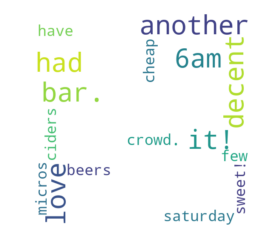

<Figure size 1800x1800 with 0 Axes>

In [508]:
import numpy as np

import os
import re
from PIL import Image
from os import path
from wordcloud import WordCloud
import matplotlib.pyplot as plt


def getFrequencyDictForText(sentence):
    fullTermsDict = {}
    tmpDict = {}

    # making dict for counting frequencies
    for text in sentence.split(" "):
        if re.match("a|the|an|the|to|in|for|of|or|by|with|is|on|that|be", text):
            continue
        val = tmpDict.get(text, 0)
        tmpDict[text.lower()] = val + 1
    for key in tmpDict:
        fullTermsDict[key] = tmpDict[key]
    return fullTermsDict


def makeImage(text):
    alice_mask = np.array(Image.open("../img/logo.png"))

    wc = WordCloud(background_color="white", max_words=1000, mask=alice_mask)
    # generate word cloud
    wc.generate_from_frequencies(text)

    # show
    plt.imshow(wc, interpolation="bilinear", shape=() )
    plt.axis("off")
    plt.figure(figsize=(25,25))
    plt.show()


# get data directory (using getcwd() is needed to support running example in generated IPython notebook)
d = path.dirname(__file__) if "__file__" in locals() else os.getcwd()


makeImage(getFrequencyDictForText(results['review_text']))

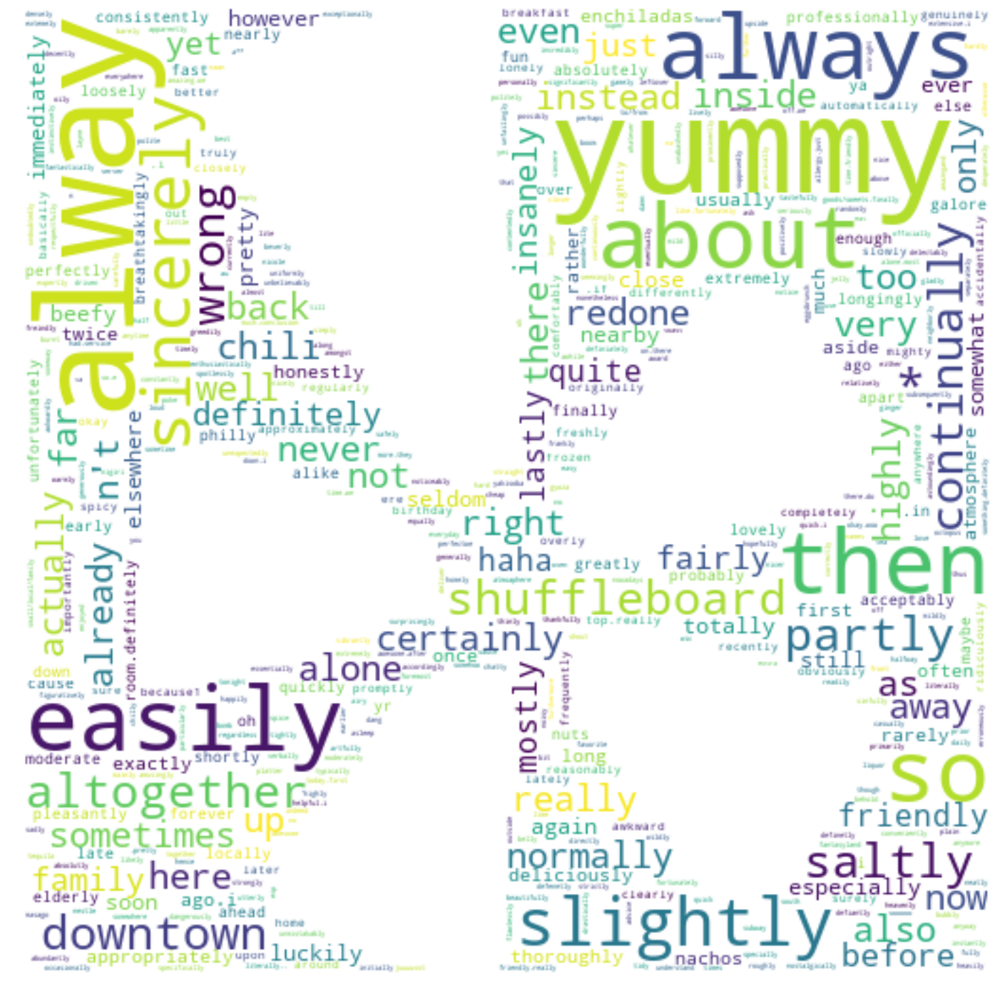

In [573]:

import numpy as np

import os
import re
from PIL import Image
from os import path
from wordcloud import WordCloud
import matplotlib.pyplot as plt


def getFrequencyDictForText(sentence):
    fullTermsDict = {}
    tmpDict = {}

    # making dict for counting frequencies
    words = word_tokenize(sentence)
    words_pos = nltk.pos_tag(words)
    for word in words_pos:
        if word[1] == 'RB':
            val = tmpDict.get(word[0], 0)
            tmpDict[word[0].lower()] = val + 1
            
    for key in tmpDict:
        fullTermsDict[key] = tmpDict[key]
    return fullTermsDict


def makeImage(text):
    yelp_mask = np.array(Image.open("../img/logo.png"))

    wc = WordCloud(background_color="white", max_words=1000, mask=yelp_mask)
    # generate word cloud
    wc.generate_from_frequencies(text)

    # show
    plt.figure(figsize=(25,25))    
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.savefig('../img/word_cloud_adverb_5_all.png', dpi=100)
    
    plt.show()

'''
results = mongoReviews.find({'bus_id': 'l9hrfKGeERWnuoUghxv5hw'}, 
                            {'review_text':1,
                             '_id':0})
                             '''

results = mongoReviews.find({'review_rating': '5.0'}, 
                            {'review_text':1,
                             '_id':0})
word_freq = {}
for r in results:
    word_freq.update(getFrequencyDictForText(r['review_text']))

high_freq = {}
for word in word_freq.keys():
    if word_freq[word] > 1:
        high_freq[word] = word_freq[word]
        
makeImage(word_freq)

In [ ]:
### 

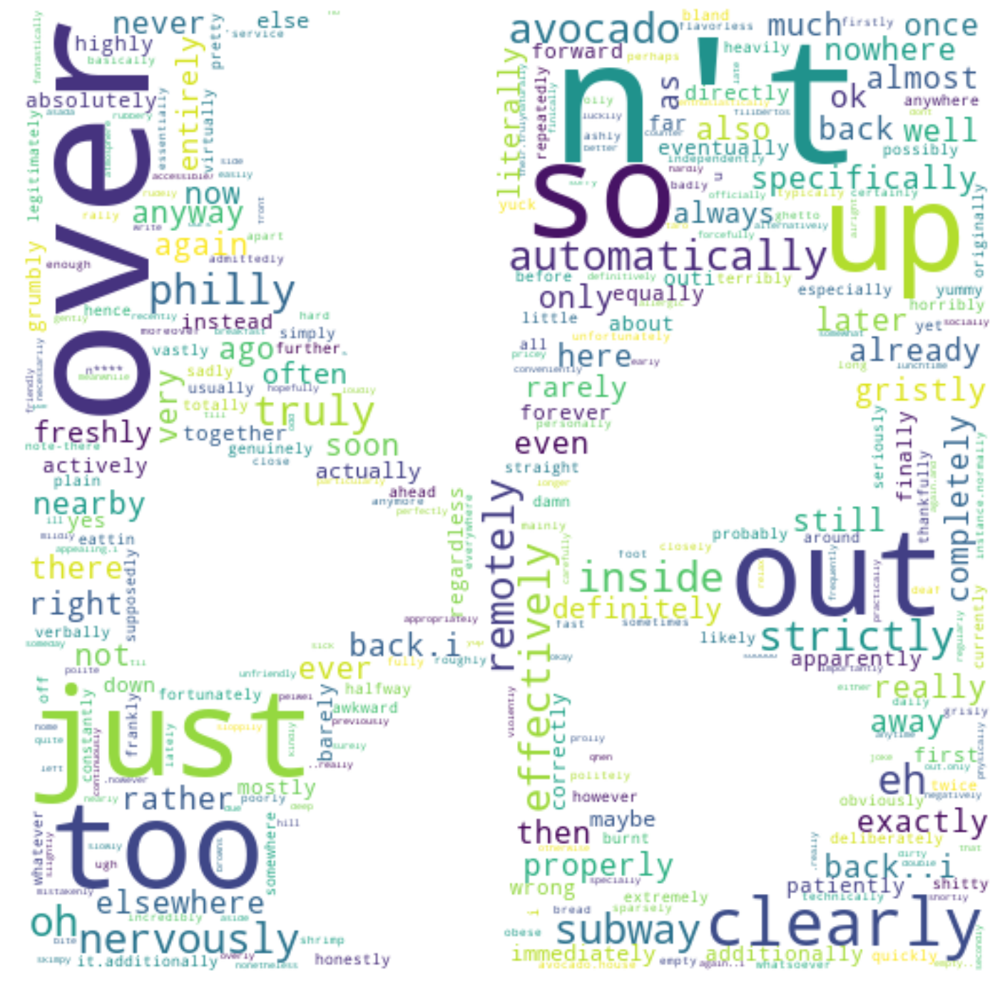

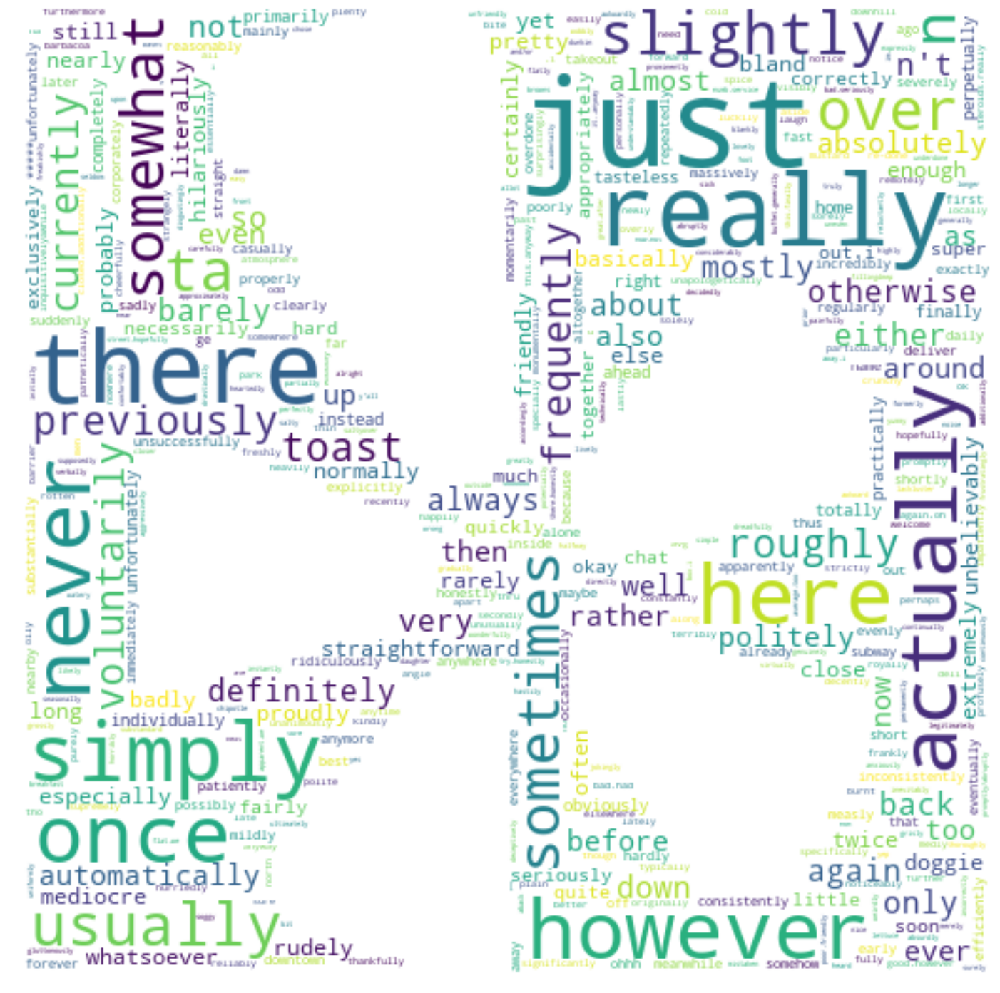

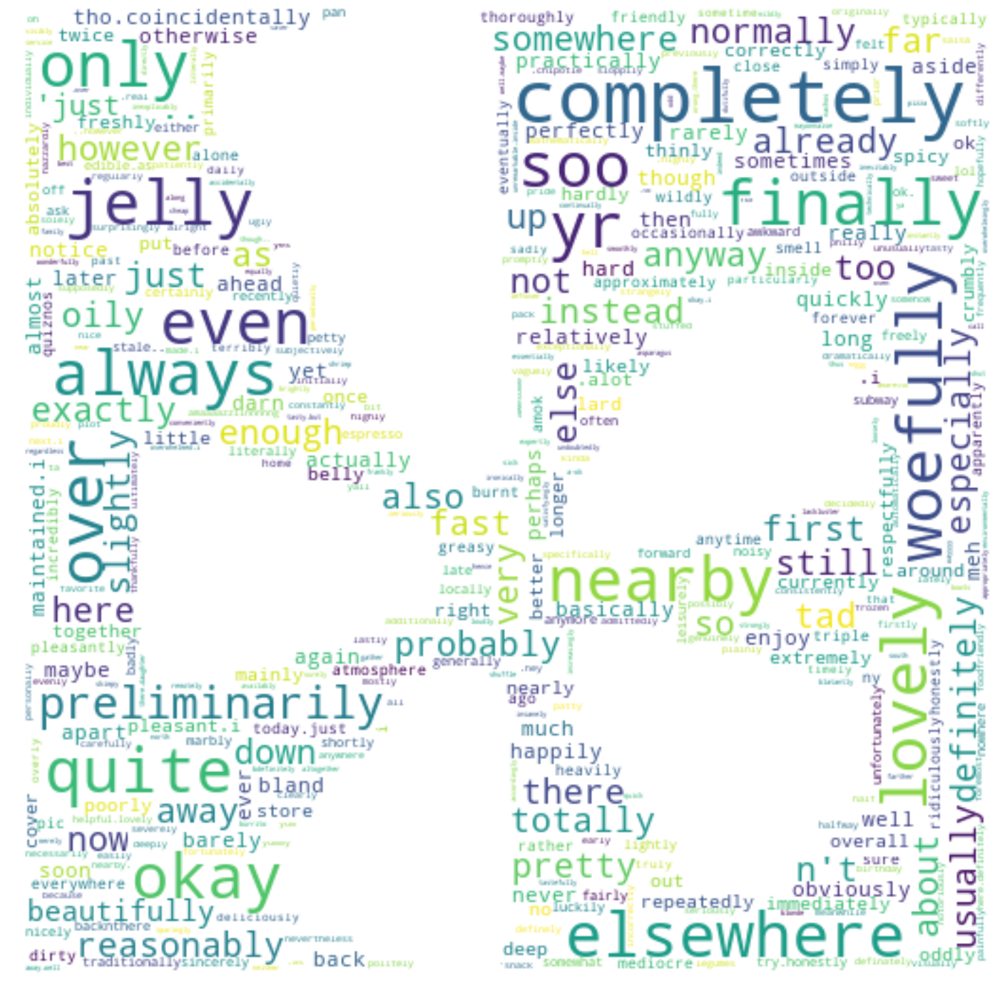

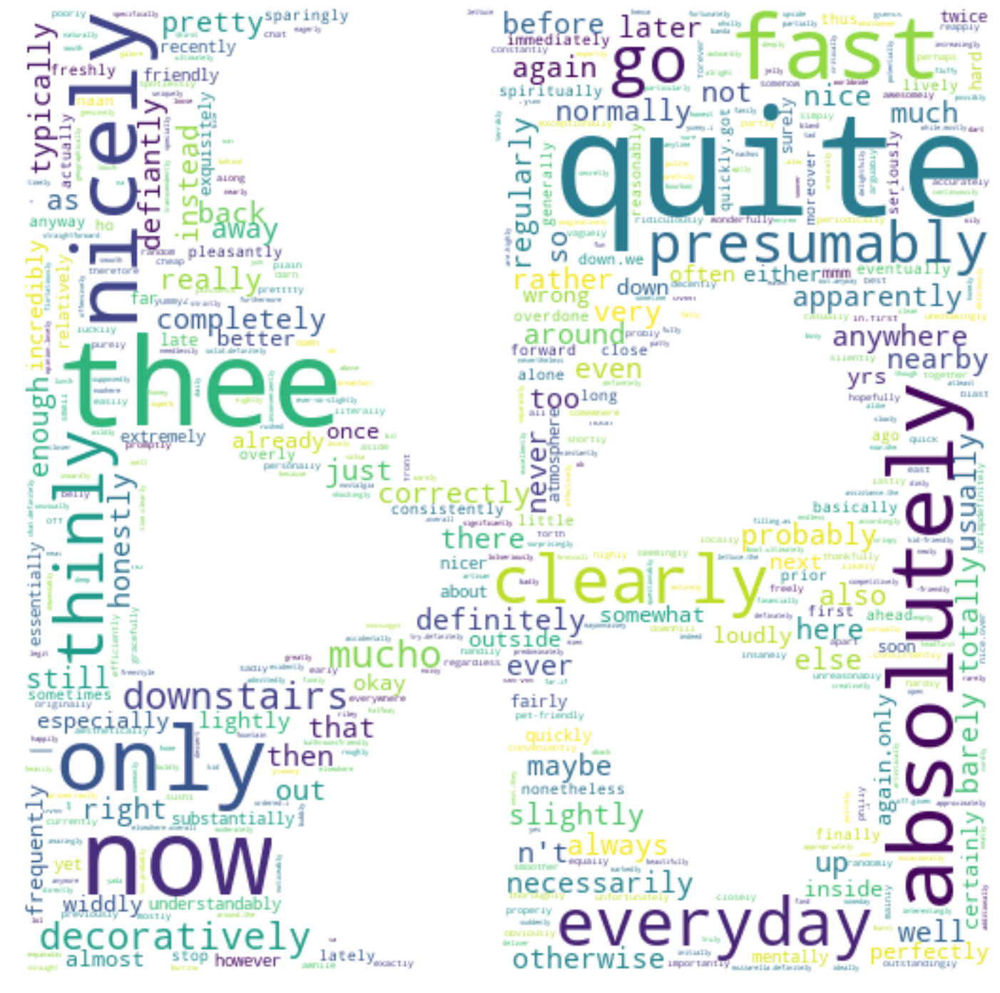

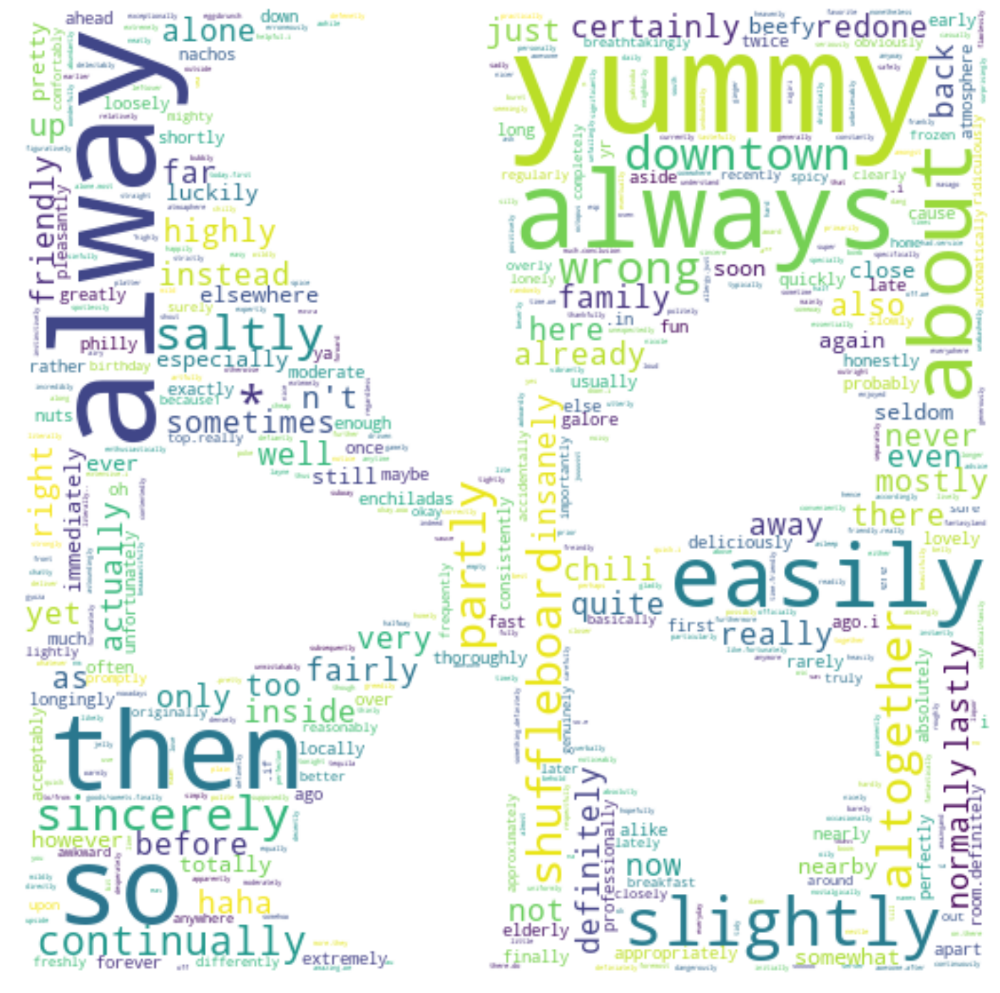

In [576]:

import numpy as np

import os
import re
from PIL import Image
from os import path
from wordcloud import WordCloud
import matplotlib.pyplot as plt


def getFrequencyDictForText(sentence):
    fullTermsDict = {}
    tmpDict = {}

    # making dict for counting frequencies
    words = word_tokenize(sentence)
    words_pos = nltk.pos_tag(words)
    for word in words_pos:
        if word[1] == 'RB':
            val = tmpDict.get(word[0], 0)
            tmpDict[word[0].lower()] = val + 1
            
    for key in tmpDict:
        fullTermsDict[key] = tmpDict[key]
    return fullTermsDict


def makeImage(text, star):
    yelp_mask = np.array(Image.open("../img/logo.png"))

    wc = WordCloud(background_color="white", max_words=1000, mask=yelp_mask)
    # generate word cloud
    wc.generate_from_frequencies(text)

    # show
    plt.figure(figsize=(25,25))    
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.savefig('../img/word_cloud_adverb_'+str(star)+'_all.png', dpi=100)
    
    plt.show()

'''
results = mongoReviews.find({'bus_id': 'l9hrfKGeERWnuoUghxv5hw'}, 
                            {'review_text':1,
                             '_id':0})
                             '''



for n in range(1,6):
    results = mongoReviews.find({'review_rating': str(n)+'.0'}, 
                                {'review_text':1,
                                 '_id':0})
    word_freq = {}
    for r in results:
        word_freq.update(getFrequencyDictForText(r['review_text']))

    makeImage(word_freq, n)

In [550]:
high_freq = {}
for word in word_freq.keys():
    if word_freq[word] > 0:
        high_freq[word] = word_freq[word]

pprint(high_freq)

{'': 1,
 '!': 2,
 '!!': 1,
 '!!!!!': 1,
 '!!pani': 1,
 '!been': 1,
 '!however,': 1,
 '"': 1,
 '"$2.00': 1,
 '"0ptimize"?': 1,
 '"a': 1,
 '"a-ok"': 1,
 '"a-ok".': 1,
 '"a-okay"': 1,
 '"a-okay",': 1,
 '"acapulcos"': 1,
 '"acceptable"': 1,
 '"ahhhhhhhh",': 1,
 '"aiyyyyy"': 1,
 '"alaskan"': 1,
 '"all': 1,
 '"allowed"': 1,
 '"almost"': 2,
 '"americanized"': 1,
 '"americanized"?the': 1,
 '"annoying': 1,
 '"anything': 1,
 '"apple': 1,
 '"are': 1,
 '"art"': 1,
 '"at': 1,
 '"award': 1,
 '"awesome"': 1,
 '"az': 1,
 '"babies"': 1,
 '"bad': 1,
 '"baja"': 1,
 '"banana': 1,
 '"bartender"': 1,
 '"bell': 1,
 '"bertos"': 1,
 '"best': 1,
 '"better",': 1,
 '"bibimbap"': 1,
 '"big"': 1,
 '"billie': 1,
 '"bit"': 1,
 '"bits': 1,
 '"black': 1,
 '"blighted"': 1,
 '"brand': 1,
 '"brisket"': 1,
 '"broiled': 1,
 '"brunch,"': 1,
 '"build': 1,
 '"burgers",': 1,
 '"by': 1,
 '"bye': 1,
 '"call': 1,
 '"camarones"': 1,
 '"camper"': 1,
 '"can': 1,
 '"carne,': 1,
 '"chain"': 1,
 '"chalkboard': 1,
 '"cheers"': 1,
 '"chic

 '(especially': 1,
 '(even': 1,
 '(ew).': 1,
 '(ex:': 1,
 '(except': 1,
 '(fat': 1,
 '(feb.2017)+': 1,
 '(fish': 1,
 '(flavor': 1,
 '(folded': 1,
 '(food': 1,
 '(for': 1,
 '(forgot': 1,
 '(four': 1,
 '(franchise': 1,
 '(free': 1,
 '(fries': 1,
 '(from': 1,
 '(front': 1,
 '(fryers': 1,
 '(full-size!)': 1,
 '(gave': 1,
 '(giant': 1,
 '(going': 1,
 '(good': 1,
 '(good)': 1,
 '(gotta': 1,
 '(granted,': 1,
 '(greeting,': 1,
 '(grilled??)': 1,
 '(gyudon,': 1,
 '(had': 1,
 '(half': 1,
 '(ham,': 1,
 '(hard': 1,
 '(hawaiian': 1,
 '(hawaiian-style': 1,
 '(he': 1,
 '(healthy': 1,
 '(hey': 1,
 '(hey,': 1,
 '(hh),': 1,
 '(hop': 1,
 '(hot': 1,
 '(how': 1,
 '(however': 1,
 '(hubba': 1,
 '(huge)quality': 1,
 '(husband': 1,
 '(i': 1,
 "(i'm": 1,
 "(i've": 1,
 '(i.e': 1,
 '(i.e.': 1,
 '(i.e.,': 1,
 '(idk': 1,
 '(if': 1,
 '(imo)': 1,
 '(in': 1,
 '(in-house)': 1,
 '(including': 1,
 '(insert': 1,
 '(instead': 1,
 '(is': 1,
 '(it': 1,
 "(it's": 1,
 '(italicize': 1,
 '(jalea': 1,
 '(jenny': 1,
 '(johnny': 1,

 '50"': 1,
 '50%': 1,
 "50's": 1,
 '50+': 1,
 '50,000': 1,
 '50-60s.': 1,
 '50-cents': 1,
 '50.': 1,
 '50/50': 1,
 '500': 1,
 '500-degree': 1,
 '50s': 1,
 '50th': 1,
 '51': 1,
 '51st': 1,
 '53': 1,
 '530pm': 1,
 '54th': 1,
 '56.00': 1,
 '59th': 1,
 '5:00!': 1,
 '5:15': 1,
 '5:30': 1,
 '5:30-6:30p).': 1,
 '5:30.': 1,
 '5:30pm.': 1,
 '5:35pm.': 1,
 '5:40pm.': 1,
 '5:45': 1,
 '5ish.': 1,
 '5mins': 1,
 '5o': 1,
 '5pm': 1,
 '5pm?!?!?!': 1,
 '5star': 1,
 '5th,': 1,
 '5x': 1,
 '6': 1,
 '6!': 1,
 '6"': 1,
 '6")': 1,
 '6,50': 1,
 '6-10': 1,
 '6-7,': 1,
 '6-8': 1,
 '6.': 1,
 '6.00': 1,
 '6.5': 1,
 '6.5%': 2,
 '6/10': 1,
 '6/16/15': 1,
 '6/7': 1,
 '60': 1,
 '60%': 1,
 "60's?": 1,
 '60/40': 1,
 '60¢': 1,
 '645pm.': 1,
 '65%': 1,
 '66': 1,
 '69': 3,
 '6:00': 1,
 '6:30': 1,
 '6:30pm': 1,
 '6am': 1,
 '6pm': 1,
 '6pm.': 1,
 '6preverse': 1,
 '7': 1,
 '7$': 1,
 '7%': 1,
 '7,': 1,
 '7-8': 1,
 '7-eleven': 1,
 '7.': 1,
 '7.5/10..': 1,
 '7.50': 1,
 '70': 1,
 '70%': 1,
 '70-80': 1,
 '70-cents': 1,
 '72$': 1,

 'battered': 1,
 'battery.': 1,
 'battle': 2,
 'bavaria': 1,
 'bavarian': 1,
 'bay': 1,
 'bbq': 1,
 'bbq!this': 1,
 'bbq,': 1,
 'bbq.': 1,
 'bbq.i': 1,
 'bbq2u': 1,
 'bc': 2,
 'bday': 1,
 'bday.': 1,
 'bdays.': 1,
 'bdefinitely': 1,
 'bdubbs': 1,
 'bdubs.': 1,
 'be': 1,
 'beach': 1,
 'beach,': 1,
 'beach.': 1,
 'bean': 1,
 'beans': 1,
 'beans),': 1,
 "bear's": 1,
 "bear's,": 1,
 "bear's.": 1,
 'bears': 1,
 'beautiful': 1,
 'beaver': 1,
 'because': 1,
 'bee,': 1,
 'beef': 1,
 'beef,': 1,
 'beef.': 1,
 'been': 1,
 'beer': 1,
 'beers': 1,
 'bees': 1,
 'before': 1,
 'before).': 1,
 'beijing': 1,
 'being': 1,
 'belching': 1,
 'belgian': 1,
 'believe': 1,
 'bell': 1,
 'bell,': 1,
 'bell.': 1,
 'bell...and': 1,
 'bell?': 1,
 'bellagio.': 1,
 'bellair': 1,
 'belly': 1,
 'belvedere': 1,
 'benedict': 1,
 "benedict's.": 1,
 'benedict,': 1,
 'benedict.': 1,
 'benedict...': 1,
 'benedict?': 1,
 'benefit-of': 1,
 'benjamin': 1,
 'benjamin,': 1,
 'bento': 1,
 'berto': 1,
 "berto's.": 1,
 'besides': 1

 'bummer,': 1,
 'bummer.': 1,
 'bump': 1,
 'bump.being': 1,
 'bumped': 1,
 'bumping': 1,
 'bumps,': 1,
 'bums': 1,
 'bun': 1,
 'bun,': 1,
 'bun-': 1,
 'bun.': 2,
 'bun.my': 1,
 'bunch': 1,
 'bunch.': 1,
 'bunnies': 1,
 'buns': 1,
 'buns.': 1,
 'buns.the': 1,
 'burden': 1,
 'burdened': 1,
 'burger': 1,
 'burger)': 1,
 'burger,': 1,
 'burger.': 2,
 'burger....comparable': 1,
 'burger/taco': 1,
 'burger:': 1,
 'burgerfi': 1,
 'burgerplace': 1,
 'burgers': 1,
 'burgers!': 1,
 'burgers,': 1,
 'burgers.': 1,
 'burgers...': 1,
 'burgers.i': 1,
 'burgers/sandwiches,': 1,
 'burgersjudging': 1,
 'buried': 1,
 'burn': 1,
 'burn,': 1,
 'burn.': 1,
 'burned': 1,
 'burned.': 1,
 'burning': 1,
 'burns': 1,
 'burnt': 2,
 'burnt!': 1,
 'burnt)...cinnabon,': 1,
 'burnt.': 1,
 'burrata': 1,
 'burrito': 3,
 'burrito!': 1,
 "burrito's": 1,
 'burrito(or': 1,
 'burrito).': 1,
 'burrito,': 1,
 'burrito--': 1,
 'burrito.': 2,
 'burrito..': 1,
 'burrito...': 1,
 'burrito.street': 1,
 "burrito.the'r": 1,
 'burri

 "church's.": 1,
 'church.': 2,
 'churn': 1,
 'churro': 1,
 'churros': 2,
 'churros,': 1,
 'churros.': 1,
 'chymist': 1,
 'ci': 1,
 'ciao': 1,
 "cici's": 1,
 'cici.': 1,
 'cider': 1,
 'cider,': 1,
 'cielo,': 2,
 'cierra': 1,
 'cigar': 1,
 'cigar.': 1,
 'cigarette': 1,
 'cigarette.': 1,
 'cigarettes': 1,
 'cigars': 1,
 'cigars.': 1,
 'cilantro': 1,
 'cilantro,': 1,
 'cilantro.': 1,
 'ciliac': 1,
 'cinco': 1,
 'cinnabon': 1,
 'cinnabon,': 1,
 'cinnabon.': 1,
 'cinnamon': 1,
 'cinnamon,': 1,
 'cinnamon-y!': 1,
 'cinnamon-y.': 1,
 'cinnamon.': 1,
 'circle': 1,
 'circle-k': 1,
 'circular': 1,
 'circumstance,': 1,
 'cities.': 1,
 'citizen': 1,
 'citizens': 1,
 'citrus': 1,
 'city': 1,
 'city,': 1,
 'city.': 1,
 'city/state': 1,
 'ciudad': 1,
 'claim': 1,
 'claimed': 1,
 'clam': 1,
 'clams': 1,
 'clap': 1,
 'clara': 1,
 'clarification': 1,
 'clarified': 1,
 'clarify': 1,
 'clash': 1,
 'class': 1,
 'class,': 1,
 'class.': 1,
 'classic': 1,
 'classic,': 1,
 'classically': 1,
 'classics': 1,
 'c

 'confusing,': 1,
 'confusing.': 1,
 'confusing.the': 1,
 'confusion': 1,
 'congratulations': 1,
 'congregates.': 1,
 'connect': 1,
 'connected': 1,
 'connection': 1,
 'connective': 1,
 'connoisseur': 1,
 'cons': 1,
 'cons:': 1,
 'cons:-food': 1,
 'cons:disappointed': 1,
 'conscientious': 1,
 'conscious': 1,
 'conscious!': 1,
 'consent': 1,
 'consented.': 1,
 'conservative': 1,
 'consider': 1,
 'consideration': 1,
 'considered': 1,
 'considered,': 1,
 'considering': 1,
 'considering!': 1,
 'considering,': 1,
 'considering.': 1,
 'consist': 1,
 'consistant': 1,
 'consistant,': 1,
 'consisted': 1,
 'consistency': 2,
 'consistency,': 1,
 'consistency.': 1,
 'consistent': 1,
 'consistent,': 1,
 'consistent.': 1,
 'consistent.was': 1,
 'consistently': 1,
 'consisting': 1,
 'consists': 1,
 'constancy': 1,
 'constant': 1,
 'constant,': 1,
 'constantly': 1,
 'constantly.': 1,
 'constitutes': 1,
 'constraints': 1,
 'construction': 1,
 'construction,': 1,
 'consult': 1,
 'consume': 1,
 'consumed

 'depressing': 1,
 'depressing.': 1,
 'dept.': 1,
 'depth': 1,
 'deputies.': 1,
 'der': 1,
 'descended': 1,
 'descent': 1,
 'descent,': 1,
 'deschutes': 1,
 'describe': 1,
 'described': 1,
 'described,': 1,
 'described.': 1,
 'description': 1,
 'descriptions': 1,
 'deseo': 1,
 'desert': 1,
 'desert,': 1,
 'desert-y': 1,
 'desert.': 1,
 'desert?': 1,
 'desert?hit': 1,
 'deserted': 1,
 'deserts': 1,
 'deserts.': 1,
 'deserve': 1,
 'deserved': 1,
 'deserves': 1,
 'deserving': 1,
 'deservs': 1,
 'design': 1,
 'design,': 1,
 'design.': 1,
 'design:by': 1,
 'designed': 1,
 'designers.': 1,
 'desirable.': 1,
 'desire': 1,
 'desired': 1,
 'desired.': 1,
 'desired.i': 1,
 'desoto.got': 1,
 'desper8': 1,
 'desperate': 1,
 'desperately': 1,
 'despise': 1,
 'despite': 1,
 'dessert': 1,
 'dessert).': 1,
 'dessert,': 1,
 'dessert.': 1,
 'dessert.i': 1,
 'dessert:': 1,
 'dessert?': 1,
 'desserts': 1,
 'desserts,': 1,
 'desserts.': 1,
 'dessert\u200b': 1,
 'destination': 1,
 'detail': 1,
 'detail.': 1

 'dust': 2,
 'dust.': 1,
 'dusty': 1,
 'dusty.': 1,
 'dustysometimes': 1,
 'dutch': 1,
 'dutchman': 1,
 'dutifully': 1,
 'duty': 1,
 'duty.': 1,
 'dying': 1,
 'dynamite': 1,
 'dynamite,': 1,
 'dysart': 1,
 'décor': 1,
 'décor.': 1,
 'e': 1,
 'ea': 1,
 'ea.': 1,
 'each': 1,
 'each).': 1,
 'each,': 1,
 'each-': 1,
 'each.': 1,
 'each.now': 1,
 'eager': 1,
 'eagerness': 1,
 'eagle': 1,
 'ear': 1,
 'earlier': 1,
 'earlier,': 1,
 'earlier.she': 1,
 'early': 1,
 'early,': 1,
 'early.': 1,
 'early...': 1,
 'early...like': 1,
 'early?': 1,
 'earn': 1,
 'earned': 2,
 'earning': 1,
 'earns': 1,
 'earth': 1,
 'earth!,,,earth': 1,
 'earthy,': 1,
 'ease.': 1,
 'ease.nothing': 1,
 'easier': 1,
 'easier)': 1,
 'easier.': 1,
 'easiest': 1,
 'easily': 1,
 'easily,': 1,
 'easily.': 1,
 'east': 1,
 'eastcoasts': 1,
 'easter': 1,
 'eastern': 1,
 'easy': 1,
 'easy,': 1,
 'easy.': 1,
 'easy.no': 1,
 'eat': 1,
 'eat!': 1,
 'eat!!': 1,
 'eat!""hmm': 1,
 'eat",': 1,
 'eat),': 1,
 'eat,': 1,
 'eat-in;': 1,
 'ea

 'fail.': 1,
 'failed': 1,
 'failed.': 1,
 'failing': 1,
 'fails': 1,
 'failure': 1,
 'faint': 1,
 'faintly': 1,
 'fair': 1,
 'fair,': 3,
 'fair.': 1,
 'fair.just': 1,
 'faire': 1,
 'fairly': 1,
 'fairmont': 1,
 'fairness': 1,
 'faith': 1,
 'fajita': 1,
 'fajitas': 1,
 'fajitas.': 1,
 'fake': 1,
 'falafel': 4,
 'falafel,': 1,
 'falicia': 1,
 'fall': 1,
 'fallen': 1,
 'fallen.': 1,
 'falling': 1,
 'falls': 1,
 'false': 1,
 'familiar': 1,
 'families': 1,
 'families.': 1,
 'families/couples': 1,
 'family': 1,
 'family).': 1,
 'family,': 1,
 'family-oriented': 1,
 'family.': 1,
 'family?': 1,
 'family?i': 1,
 'famished': 1,
 'famlies---like': 1,
 'famous': 1,
 'fan': 1,
 'fan!': 1,
 'fan"': 1,
 'fan)': 1,
 'fan,': 1,
 'fan.': 1,
 'fanatic': 1,
 'fancier': 1,
 'fanciness': 1,
 'fancy': 1,
 'fancy,': 1,
 'fancy.': 1,
 'fancy.today': 1,
 'fanned': 1,
 'fanning': 1,
 'fans': 1,
 'fans,': 1,
 'fantastic': 1,
 'fantastic!': 1,
 'fantastic,': 1,
 'fantastic.': 1,
 'fantastic....alot': 1,
 'fantas

 'friday-': 1,
 'friday.': 1,
 'friday/mcdowell': 1,
 'fridays': 1,
 'fridays.': 1,
 'fridge': 1,
 'fried': 2,
 'fried),': 1,
 'fried,': 1,
 'fried.': 1,
 'fried.and': 1,
 'fried/grilled': 1,
 'friend': 1,
 "friend's": 1,
 "friend's.": 1,
 'friend,': 1,
 'friend.': 1,
 'friend.we': 1,
 'friendlier': 1,
 'friendliest': 1,
 'friendliest.': 1,
 'friendliness': 2,
 'friendliness.': 1,
 'friendliness.according': 1,
 'friendly': 1,
 'friendly!': 1,
 'friendly!!': 1,
 'friendly).the': 1,
 'friendly,': 1,
 'friendly,.': 1,
 'friendly,however': 1,
 'friendly-will': 1,
 'friendly.': 1,
 'friendly...': 1,
 'friendly...which': 1,
 'friendly.do': 1,
 'friendly.i': 1,
 'friendly.it': 1,
 'friendly.my': 1,
 'friendly.ordered,': 1,
 'friendly.return': 1,
 'friendly.the': 1,
 'friendly.there': 1,
 'friendly.they': 1,
 'friendly.we': 1,
 'friendly:': 1,
 'friendly;': 1,
 'friends': 1,
 'friends!!!!': 1,
 "friends'": 1,
 'friends)': 1,
 'friends,': 1,
 'friends-': 1,
 'friends.': 1,
 'friends.the': 1,
 '

 'grimaced': 1,
 "grimaldi's": 1,
 'grin': 1,
 'gringo': 1,
 'gringos': 1,
 'gringos).': 1,
 'gripe': 1,
 'grisel,': 1,
 'grisle.': 1,
 'gristle': 1,
 'gristly': 1,
 'grits': 1,
 'grits!': 2,
 'grits.': 1,
 'gritty': 1,
 'gritty.': 1,
 'groans': 1,
 'grocer.': 1,
 'groceries': 1,
 'groceries.': 1,
 'grocery': 1,
 'grooves.': 1,
 'gross': 1,
 'gross!': 1,
 'gross).i': 1,
 'gross,': 1,
 'gross.': 1,
 'grossed': 1,
 'grosses': 1,
 'grossly': 1,
 'grossss!!!': 1,
 'grossssssss!': 1,
 'grouchy': 1,
 'ground': 2,
 'ground.': 1,
 'grounds': 1,
 'group': 1,
 'group,': 1,
 'group.': 1,
 'grouper': 1,
 'groupon': 1,
 'groupon,': 1,
 'groupon.': 1,
 'groupons': 1,
 'groups': 1,
 'groups).the': 1,
 'groups,': 1,
 'groups.': 1,
 'grove': 1,
 'grove.': 1,
 'grow': 1,
 'growing': 1,
 'growlers.': 1,
 'grown': 1,
 'grub': 1,
 'grub.': 1,
 'grubhub': 1,
 'grubhub,': 1,
 'grubhub.': 1,
 'grudge': 1,
 'grungy.': 1,
 'gruyere': 1,
 'guac': 1,
 'guac,': 1,
 'guac.': 1,
 'guacamole': 1,
 'guacamole)': 1,
 '

 'idealism': 1,
 'ideally': 1,
 'identical': 1,
 'identical.': 1,
 'identified': 1,
 'identify': 1,
 'identifying': 1,
 'idiots': 1,
 'idk': 1,
 'idk.': 1,
 'ie': 1,
 'if': 1,
 'if,': 1,
 'ignore': 1,
 'ignored': 1,
 'ignored.': 1,
 'ignoring': 1,
 'ihop': 1,
 'ihop,': 1,
 'ihop.': 1,
 "il's": 1,
 'ill': 1,
 'illegal': 1,
 'illegal."': 1,
 'illegible.': 1,
 'illusion': 1,
 'im': 1,
 'image': 1,
 'imaginable': 1,
 'imaginative.': 1,
 'imagine': 1,
 'imagine.': 1,
 'imagined': 1,
 'imagined.': 1,
 'imagined;': 1,
 'imagining': 1,
 'imho': 1,
 'imho,': 1,
 'imho.': 1,
 'imitation': 1,
 'immaculate.': 1,
 'immaculatestaff....the': 1,
 'immediate': 1,
 'immediately': 1,
 'immediately,': 1,
 'immediately.': 1,
 'immense': 1,
 'immersion': 1,
 'imo': 1,
 'imo.': 1,
 'imo....the': 1,
 'imo...i': 1,
 'imo.we': 1,
 'impact': 1,
 'impatient': 1,
 'imperative': 1,
 'imperfect': 1,
 'imperfections': 1,
 'impersonal': 1,
 'impersonal.': 1,
 'implement': 1,
 'implementing': 1,
 'implies...': 1,
 'imp

 'laptop,': 1,
 'lard': 1,
 'lard,': 2,
 'lard.': 1,
 'lard.however,': 1,
 'laredo': 1,
 'large': 1,
 'large!""i': 1,
 'large,': 1,
 'large.': 1,
 'larger': 1,
 'larger)he': 1,
 'larger,': 1,
 'larger.': 1,
 'largest': 1,
 'largest,': 1,
 'las': 1,
 'lasagna': 1,
 'lasagna,': 1,
 'lasagne': 1,
 'lasagne,': 1,
 'lassi': 1,
 'last': 1,
 'last?': 1,
 'lasted': 1,
 'lasting': 1,
 'lastly': 1,
 'lastly,': 1,
 'late': 1,
 'late,': 1,
 'late-night': 1,
 'late.': 1,
 'late...': 1,
 'late.return': 1,
 'lately': 1,
 'lately,': 1,
 'lately.': 1,
 'later': 1,
 'later!': 1,
 'later!"': 1,
 "later!it's": 1,
 'later)': 1,
 'later,': 1,
 'later.': 1,
 'later.i': 1,
 'later.the': 1,
 'latest': 1,
 'lathered': 1,
 'latin': 1,
 'latin-inspired': 1,
 'latino': 1,
 'latinos.': 1,
 'latitude': 1,
 'latte': 1,
 'latte,': 1,
 'latte.': 1,
 'latter': 1,
 'laud': 1,
 'laughed': 1,
 'laughing': 1,
 'laughing.': 1,
 'laughs!': 1,
 'laughter': 1,
 'laulau': 1,
 'laulau.': 1,
 'lava': 1,
 'laveen': 1,
 'lavender': 

 'make-shift': 1,
 'make.': 1,
 'makeing': 1,
 'makeover': 1,
 'maker': 1,
 'maker,': 1,
 'maker.': 1,
 'makes': 1,
 'makes.': 1,
 'makes.taquitos': 1,
 'maki': 1,
 'making': 1,
 'malasadas': 1,
 'male': 1,
 'malibu': 1,
 'mall': 1,
 'mall!i': 1,
 'mall,': 1,
 'mall.': 1,
 'mall...do': 1,
 'mall.it': 1,
 'mall.this': 1,
 'malls': 1,
 "malnati's,": 1,
 'malt': 2,
 'malted': 1,
 'malts': 1,
 'mama-y-papa': 1,
 'mamacita': 1,
 'mammoths': 1,
 'man': 1,
 'man(the': 1,
 'man,': 1,
 'man.': 1,
 'man...': 1,
 'manage': 1,
 'manage.': 1,
 'manageable': 1,
 'manageable.overall': 1,
 'managed': 1,
 'managed,': 1,
 'managed.': 1,
 'management': 1,
 'management,': 1,
 'management.': 1,
 'management:': 1,
 'manager': 1,
 'manager"': 1,
 'manager)': 1,
 'manager,': 1,
 'manager.': 1,
 "manager.let's": 1,
 'manager/owner': 1,
 'manager?': 1,
 'managers': 1,
 'manages': 1,
 'managing': 1,
 'manchego': 1,
 'mandarin.': 1,
 'maneuver': 1,
 'manger': 1,
 'manger.': 1,
 'mango': 1,
 'mango.': 1,
 'mangoes

 'moderate.': 1,
 'moderately': 1,
 'modern': 1,
 'modern,': 1,
 'modernized,': 1,
 'modest': 1,
 'modification.': 1,
 'modifications).': 1,
 'modified': 1,
 'modify': 2,
 'mofongo': 2,
 'mofongo,': 1,
 'mofongo.': 1,
 'moi....or': 1,
 'moist': 1,
 'moist,': 1,
 'moist.': 1,
 'moisture': 1,
 'moisture.': 1,
 'mojo': 1,
 'mokis': 1,
 'molasses': 1,
 'mold': 2,
 'moldy,': 1,
 'mole': 1,
 'mole.': 1,
 'mollen': 1,
 'molly': 1,
 'molten': 1,
 'mom': 1,
 "mom's": 1,
 'mom,': 1,
 'mom-and-pop': 1,
 'mom-and-pop,': 1,
 'mom.': 1,
 'moment': 1,
 'moment!': 1,
 'moment,': 1,
 'moment.': 1,
 'moment.the': 1,
 'momma': 1,
 'mommy': 1,
 'moms': 1,
 'monday': 1,
 "monday-friday's.": 1,
 'monday-saturday': 1,
 'monday.': 1,
 'mondays': 1,
 'mondays-fridays': 1,
 'mondays.': 1,
 'money': 1,
 "money's": 1,
 'money,': 1,
 'money.': 1,
 'money."': 1,
 'money...i': 1,
 'money.in': 1,
 'money.so': 1,
 'moneys': 1,
 'mongolian': 1,
 'monitoring': 1,
 'monitors': 1,
 'monkeys': 1,
 'monster': 1,
 'monte': 1

 'ottos': 1,
 'ouch': 1,
 'ouch.': 1,
 'ouch.finally': 1,
 'ouch.on': 1,
 'ought': 1,
 'ounce': 1,
 'ounces.': 1,
 'our': 1,
 'ours': 1,
 'ours,': 1,
 'ours.': 1,
 'ours.3': 1,
 'ourselves': 1,
 'ourselves.': 1,
 'ourselves.back': 1,
 'out': 1,
 'out!': 1,
 'out!""lots': 1,
 'out!#vino2': 1,
 'out!)the': 1,
 "out!it's": 1,
 'out!the': 1,
 'out"': 1,
 'out".': 1,
 "out's": 1,
 'out)': 1,
 'out),': 1,
 'out).': 1,
 'out,': 1,
 'out-': 1,
 'out-of-town': 1,
 'out-of-vegas': 1,
 'out.': 1,
 'out.#cavemanburger': 1,
 'out..': 1,
 'out...': 1,
 'out...#vino2ultimate': 1,
 'out....': 1,
 'out...they': 1,
 'out.i': 1,
 'out.maybe': 1,
 'out.my': 1,
 'out.the': 1,
 'out;': 1,
 'outage': 1,
 'outback': 1,
 'outback.': 1,
 'outcast.': 1,
 'outclassed': 1,
 'outcome': 2,
 'outcome.': 1,
 'outdated': 1,
 'outdoor': 1,
 'outdoors': 1,
 'outdoors),': 1,
 'outdoors,': 1,
 'outfit': 1,
 'outfits+alcohol)': 1,
 'outgoing': 1,
 'outgoing.': 1,
 'outi': 1,
 'outing': 1,
 'outlet': 1,
 'outlet.': 1,
 'outl

 'plastic,': 1,
 'plastic.': 1,
 'platanos': 1,
 'plate': 2,
 'plate!': 1,
 'plate".': 1,
 'plate)': 1,
 'plate,': 1,
 'plate.': 1,
 'plate..': 1,
 'plate...': 1,
 'plate.servers': 1,
 'plated': 1,
 'plated.': 1,
 'plateful': 1,
 'plates': 1,
 'plates,': 1,
 'plates.': 1,
 'plates.it': 1,
 'plating': 1,
 'plato': 1,
 'platter': 2,
 'platter,': 1,
 'platter.': 1,
 'platters': 1,
 'play': 1,
 'play.': 2,
 'playa': 1,
 'played': 1,
 'player': 1,
 'player,': 1,
 'players,': 1,
 'players.': 1,
 'playful': 1,
 'playground': 1,
 'playground,': 1,
 'playing': 1,
 'playing!': 1,
 'playing.': 1,
 'playing;': 1,
 'playoff': 1,
 'plays': 1,
 'playtime': 1,
 'plaza': 1,
 'plaza.': 1,
 'plazas.': 1,
 'pleasant': 1,
 'pleasant!!!': 1,
 'pleasant)': 1,
 'pleasant,': 1,
 'pleasant.': 1,
 'pleasant..': 1,
 'pleasant.i': 1,
 'pleasant.lots': 1,
 'pleasant.on': 1,
 'pleasant.we': 1,
 'pleasant;': 1,
 'pleasantly': 1,
 'pleasantries': 1,
 'please': 1,
 'please!': 1,
 'please"...': 1,
 'please),,so': 1,
 'p

 'remark': 1,
 'remarkable': 1,
 'remarkable.': 1,
 'remarks': 1,
 'remeber': 1,
 'remedied': 1,
 'remedy': 1,
 'remember': 1,
 'remember,': 1,
 'remember...': 1,
 'remembered': 1,
 'remembered!': 1,
 'remembered.': 1,
 'remembered.overall,': 1,
 'remind': 1,
 'reminded': 1,
 'reminds': 1,
 'reminiscent': 1,
 'remodel': 1,
 'remodel.': 1,
 'remodeled': 1,
 'remodeled,': 1,
 'remodeling': 1,
 'remodeling".': 1,
 'remodeling,': 1,
 'remorse': 1,
 'remotely': 1,
 'remoulade': 1,
 'remove': 1,
 'removed': 1,
 'removed).': 1,
 'removed.': 1,
 'removing': 1,
 'renamed': 1,
 'renditions': 1,
 "rennick's": 1,
 'renovated': 1,
 'renovated,': 1,
 'renovated.had': 1,
 'renovating.': 1,
 'renowned': 1,
 'rent': 1,
 'rent,': 1,
 'rental': 2,
 'rep,': 1,
 'repaint': 1,
 'repair': 1,
 'repaired),': 1,
 'repeat': 1,
 'repeat.': 1,
 'repeated': 1,
 'repeatedly': 1,
 'repetitive': 1,
 'replace': 1,
 'replaced': 1,
 'replaced,': 1,
 'replaced.': 1,
 'replacement.': 1,
 'replaces': 1,
 'replacing': 1,
 'r

 'salty,': 1,
 'salty---saying': 1,
 'salty.': 1,
 'salty.for': 1,
 'salty;': 1,
 'salvadoran': 1,
 'salvadorean': 1,
 'salvadorian.': 1,
 'same': 1,
 'same!': 1,
 'same,': 1,
 'same.': 1,
 'same...just': 1,
 'same..unless': 1,
 'same.all': 1,
 'sammie': 1,
 'sammies,': 1,
 'samosas': 2,
 'sample': 1,
 'sample,': 1,
 'sampled': 1,
 'sampler': 1,
 'sampler,': 1,
 'samples': 1,
 'sampling': 1,
 'sampling/comparing': 1,
 'samplings': 1,
 'sams': 1,
 'samurai': 1,
 'san': 1,
 'sanctuary': 1,
 'sand': 1,
 'sand,': 1,
 'sandwhich': 4,
 'sandwich': 2,
 'sandwich!': 1,
 'sandwich"': 1,
 'sandwich)': 1,
 'sandwich,': 1,
 'sandwich.': 1,
 'sandwich..': 1,
 "sandwich....it's": 1,
 'sandwich.for': 1,
 'sandwich.older': 1,
 'sandwich.props': 1,
 'sandwich.the': 1,
 'sandwich.thickly': 1,
 'sandwich.you': 1,
 'sandwich/subs.': 1,
 'sandwich:i': 1,
 'sandwich;': 1,
 'sandwiched': 1,
 'sandwiches': 1,
 'sandwiches),': 1,
 'sandwiches,': 1,
 'sandwiches.': 2,
 'sandwiches...': 1,
 'sandwichs': 1,
 'san

 'skimped': 1,
 'skimpier': 1,
 'skimping': 1,
 'skimpy': 1,
 'skimpy.': 1,
 'skin': 1,
 'skin!!!': 1,
 'skin,': 1,
 'skin.': 1,
 'skinnier,': 1,
 'skinniest': 1,
 'skinny': 1,
 'skinny,': 1,
 'skinny.': 1,
 'skins': 1,
 'skins...': 1,
 'skinsyelp.com/biz_photos/j-d-…yelp.com/biz_photos/j-d-…cheese': 1,
 'skip': 1,
 'skipped': 1,
 'skordilia.': 1,
 'sky': 1,
 'sky!!': 1,
 'skype': 1,
 'skyrocketed': 1,
 'skyyyyyyyyy': 1,
 'slab': 1,
 'slack': 1,
 'slack-faced,': 1,
 'slam': 1,
 'slam:': 1,
 'slammed': 1,
 'slammed.': 1,
 'slammed.the': 1,
 'slamwich': 1,
 'slant': 1,
 'slap': 1,
 'slapped': 1,
 'slathered': 1,
 'slaw': 1,
 'slaw,': 1,
 'slaw.': 1,
 'slaws': 1,
 'sleek': 1,
 'sleep': 1,
 'sleep.': 1,
 'sleeping': 1,
 'slice': 4,
 'slice"': 1,
 'slice.': 1,
 'slice.i': 1,
 'sliced': 1,
 'slicer': 1,
 'slices': 1,
 'slices),': 1,
 'slices,': 1,
 'slices.': 1,
 'slicing': 1,
 'slid': 1,
 'slide': 1,
 'slide.': 1,
 'slider': 1,
 'slider;': 1,
 'sliders': 1,
 'sliders,': 1,
 'sliders.': 2,
 

 'standouts': 1,
 'standpoint': 1,
 'stands': 1,
 'stands,': 1,
 'stans': 1,
 'staple': 1,
 'staples': 1,
 'staples.': 1,
 'stapley.': 1,
 'star': 1,
 'star!': 1,
 'star)the': 1,
 'star)we': 1,
 'star,': 1,
 'star,we': 1,
 'star.': 1,
 'star."': 1,
 'star..': 1,
 'star....maybe.': 1,
 'star.2nd': 1,
 'star.3rd': 1,
 'star.all': 1,
 'star.photo': 1,
 'starbuck': 1,
 'starbucks': 1,
 'starbucks!': 1,
 "starbucks's": 1,
 'starbucks,': 1,
 'starbucks.': 1,
 'starbucks...': 1,
 'starch,': 1,
 'starchy.': 1,
 'stare': 1,
 'stare,': 1,
 'stared': 1,
 'staring': 1,
 'staring.': 1,
 'starred': 1,
 'starring': 1,
 'stars': 1,
 'stars!': 1,
 'stars!!but': 1,
 'stars!i': 1,
 'stars)': 1,
 'stars)because': 1,
 'stars)the': 1,
 'stars,': 1,
 'stars.': 1,
 'stars."': 1,
 'stars..': 1,
 'stars...': 1,
 'stars...they': 1,
 'stars.1st': 1,
 'stars.but': 1,
 'stars.dinner:': 1,
 'stars.hot': 1,
 'stars.i': 1,
 'stars.lunch:': 1,
 'stars.never': 1,
 'stars.not': 1,
 'stars.now-': 1,
 'stars.onion': 1,
 's

 'taco).': 1,
 'taco,': 1,
 'taco.': 1,
 'taco......this': 1,
 'tacos': 1,
 'tacos!': 1,
 'tacos"': 1,
 'tacos""well,': 1,
 'tacos(street': 1,
 'tacos,': 1,
 'tacos-': 1,
 'tacos.': 1,
 'tacos."': 1,
 'tacos....': 1,
 'tacos....it': 1,
 'tacos.i': 1,
 'tacos.service': 1,
 'tacos.taco': 1,
 'tacos:': 1,
 'tacos;': 1,
 'tacqueria': 1,
 'tacquerias': 1,
 'tad': 1,
 'taffer': 1,
 'tag': 1,
 "tag's": 1,
 'tag.': 1,
 'tag.big': 1,
 'tagging.': 1,
 'tagliani...': 1,
 'tai': 2,
 'taiburger': 1,
 'tail': 1,
 'tail,': 1,
 'tailgate': 1,
 'tailgaters,': 1,
 'tailored': 1,
 'tails': 1,
 'tails,': 1,
 'taipei.': 1,
 'taiwanese': 1,
 'takamatsu': 1,
 'takamatsu,': 1,
 'take': 1,
 'take-': 1,
 'take-home': 1,
 'take-out': 1,
 'take-out,': 1,
 'take-out.': 1,
 'take/get': 1,
 'taken': 1,
 'taken,': 1,
 'taken.': 1,
 'takeout': 1,
 'takeout,': 1,
 'takeout.': 1,
 'taker': 1,
 'takes': 1,
 'taking': 2,
 'talk': 1,
 'talk,': 1,
 'talk.': 1,
 'talkative': 1,
 'talked': 1,
 'talking': 1,
 'talking.': 1,
 '

 'tofu.': 1,
 'together!': 1,
 'togo': 1,
 "togo's": 1,
 'toilet': 1,
 'tokyo': 1,
 'told': 1,
 'tolleson': 1,
 'tom': 1,
 'tomas': 1,
 'tomas-': 1,
 "tomasso's.": 1,
 'tomato': 1,
 'tomatoes,': 1,
 'tombstone': 1,
 'tommy': 1,
 'ton': 1,
 'tonight': 1,
 'tonion': 1,
 'tonkatsu': 1,
 'tonkatsu,': 1,
 'too': 1,
 "too's": 1,
 'took': 1,
 'top': 1,
 'topgolf.': 1,
 'topped': 1,
 'toppings': 1,
 'tornadoes.': 1,
 'torta': 1,
 'torta.': 1,
 'tortas': 1,
 'tortas.': 1,
 'tortilla': 1,
 'tortillas': 1,
 'tostada': 1,
 'tostada.': 1,
 'tostado.': 1,
 'total': 1,
 'totally': 1,
 'tour.': 1,
 'tour:': 1,
 'tower.': 1,
 'town': 1,
 'town.': 1,
 'town.the': 1,
 'traces': 1,
 'traci': 1,
 'traci)!': 1,
 'track': 1,
 'tracking.we': 1,
 'tracks': 1,
 'trade': 1,
 'tradition': 1,
 'tradition.': 1,
 'traditional': 1,
 'traditional,': 1,
 'traditional.': 1,
 'traditional...': 1,
 'traditionally': 1,
 'traditionally,': 1,
 'traeger.the': 1,
 'traffic': 1,
 'traffic.': 1,
 'trafficked,': 1,
 'trail': 1,
 

 'upstairs': 1,
 'upstairs.': 1,
 'ur': 1,
 'urban': 1,
 'urge': 1,
 'urgency': 1,
 'urgency.': 1,
 'urges': 1,
 'urinal': 2,
 'urinal.': 1,
 'urine': 1,
 'urn': 1,
 'us': 1,
 'us!': 1,
 'us)': 1,
 'us),': 1,
 'us,': 1,
 'us.': 2,
 'us..': 1,
 'us...uh': 1,
 'us.all': 1,
 'us.at': 1,
 'us.atmosphere': 1,
 'us/': 1,
 'us:': 1,
 'us;': 1,
 'usda': 1,
 'use': 1,
 'use,': 1,
 'use.': 1,
 'used': 1,
 'used,': 1,
 'used--': 1,
 'used.': 1,
 'used?the': 1,
 'useless': 1,
 'uses': 1,
 'using': 1,
 'usual': 1,
 'usual,': 1,
 'usual.': 1,
 'usual..': 1,
 'usually': 1,
 'usually,': 1,
 'usuals': 1,
 'usualy': 1,
 'uswere': 1,
 'utensil': 1,
 'utensils': 1,
 'utensils!': 1,
 'utensils,': 1,
 'utensils.': 1,
 'utilize': 1,
 'utilized': 1,
 'utopia)': 1,
 'utter': 1,
 'utterly': 1,
 "v's.": 1,
 'v.)': 1,
 'vacant': 1,
 'vacation': 1,
 'vacation,': 1,
 'vacation.': 1,
 'vacationing': 1,
 'vacuum': 1,
 'vaguely': 1,
 "valentine's": 1,
 'valerie': 1,
 'valet': 1,
 'valid': 1,
 'valid,': 1,
 'validate':

 'whichever': 1,
 'while': 2,
 'while"': 1,
 'while,': 1,
 'while.': 1,
 'while..': 1,
 'while.overall,': 1,
 'while.they': 1,
 'whilst': 1,
 'whim': 1,
 'whim,': 1,
 'whining': 1,
 'whip': 1,
 'whip.': 1,
 'whipped': 1,
 'whips.': 1,
 'whirl??': 1,
 'whiskey': 1,
 'whiskey!': 1,
 'whisky': 1,
 'whisky,': 1,
 'whispered': 1,
 'white': 1,
 'white.': 1,
 'whites': 1,
 'whites.': 2,
 'whitney': 1,
 'who': 1,
 "who'd": 1,
 "who's": 1,
 'who,': 1,
 'whoes': 1,
 'whoever': 1,
 'whole': 1,
 'whole.': 1,
 'wholefoods': 1,
 'whom': 1,
 'whomever': 1,
 'whopper': 1,
 'whoppers': 1,
 'whopping': 1,
 'whose': 1,
 'why': 1,
 'why!': 1,
 'why!original': 1,
 'why,': 1,
 'why.': 1,
 'why....': 1,
 'why?': 1,
 'wi': 1,
 'wi-fi': 1,
 'wi-fi,': 1,
 'wich': 1,
 'wich.': 1,
 'wickenburg': 1,
 'wide': 1,
 'wide.': 1,
 'wiener': 1,
 'wieners': 1,
 'wieners.': 1,
 'wienerschnitzel': 1,
 'wienerschnitzel.': 1,
 'wife': 1,
 "wife's": 1,
 'wife)': 1,
 'wife,': 1,
 'wife.': 1,
 'wifi': 1,
 'wifi,': 1,
 'wiki,': 1

 '\xa0dessert': 1,
 '\xa0did': 1,
 "\xa0didn't": 1,
 '\xa0different': 1,
 '\xa0difficult': 1,
 '\xa0dinner': 1,
 '\xa0disappointed.': 1,
 '\xa0disappointing.': 1,
 '\xa0do': 1,
 '\xa0does': 1,
 "\xa0doesn't": 1,
 "\xa0don't": 1,
 '\xa0double': 1,
 '\xa0dressing': 1,
 '\xa0drinks': 1,
 '\xa0due': 1,
 '\xa0dumplings': 1,
 '\xa0during': 1,
 '\xa0each': 1,
 '\xa0earlier': 1,
 '\xa0egg': 1,
 '\xa0eggs': 1,
 '\xa0ehhh,': 1,
 '\xa0either.i': 1,
 '\xa0employees': 1,
 '\xa0enchilada': 1,
 '\xa0enjoy': 1,
 '\xa0entrees': 1,
 '\xa0especially': 1,
 '\xa0etc': 1,
 '\xa0etc...we': 1,
 '\xa0even': 1,
 '\xa0eventually': 1,
 '\xa0eventually,': 1,
 '\xa0every': 1,
 '\xa0everyone': 1,
 '\xa0everything': 1,
 '\xa0everytime': 1,
 '\xa0except': 1,
 '\xa0expect': 1,
 '\xa0expected': 1,
 '\xa0expensive': 1,
 '\xa0family': 1,
 '\xa0fan': 1,
 '\xa0fareast': 1,
 '\xa0fast.': 1,
 '\xa0feel': 1,
 '\xa0feeling': 1,
 '\xa0finally,': 1,
 '\xa0first': 1,
 '\xa0first,': 1,
 '\xa0flautas': 1,
 '\xa0flavor': 1,
 '\xa0fla

In [564]:
nltk.pos_tag(['word'])[0][1]

'NN'

In [554]:
text = word_tokenize("They refuse to permit us to obtain the refuse permit")
nltk.pos_tag(text)


[('They', 'PRP'),
 ('refuse', 'VBP'),
 ('to', 'TO'),
 ('permit', 'VB'),
 ('us', 'PRP'),
 ('to', 'TO'),
 ('obtain', 'VB'),
 ('the', 'DT'),
 ('refuse', 'NN'),
 ('permit', 'NN')]

In [556]:
text = word_tokenize("They refuse to permit us to obtain the refuse permit")
word_pos = nltk.pos_tag(text)

[word[0] for word in word_pos if word[1] == 'NN' ]

['refuse', 'permit']

In [577]:
results = mongoReviews.find({"review_rating": "5.0", "review_text" : {'$regex' : ".*wedding.*"}});
#pprint(results)
#results.count()
for r in results:
    pprint(r)

{'_id': ObjectId('5b847ab83d38dc7c345ab15d'),
 'bus_id': 'e4qQlNEop42LoFBwv71dVw',
 'review_cool': '3',
 'review_date': '1/1/2018',
 'review_funny': '1',
 'review_id': '3AvSBavhhxyfbFMUwio6Hg',
 'review_rating': '5.0',
 'review_text': 'My wife and I celebrated our 36th wedding anniversary here '
                'and it was well worth it. Our server Todd was always making '
                'sure we were very satisfied with our meal and service. He was '
                'very knowledgeable and social.When we ordered our meal he '
                'mentioned that the kitchen was a little behind.We started '
                'with the Crab Stack which had lumps of blue crab atop avocado '
                'and mango, which was a substitute for our salad.I ordered the '
                'petite rib eye, 12 oz and my wife had the petite filet, 6 oz, '
                'and lobster. I decided to add 6 shrimp to my steak. On the '
                'side, we added mashed potatoes and sautéed mushroom

In [ ]:

results = mongoReviews.find({}, {'_id':0});


## Tensor Flow

In [425]:
import tensorflow as tf

ModuleNotFoundError: No module named 'tensorflow'

In [450]:
train_X[0:1]

array(["Not impressed. After my stepson raved about how good the wings were, he insisted on going back for some dinner. I had the Garlic Parmesan wings. Um, uh, err...they were ok. The fries were good and the donuts, if that's what you call them, was just ok. The wings were not crunchy on the outside, but cooked. The sauce was just ok. So, to give OUR community another chance, to redeem themselves we went back earlier this week and again and my opinion is the same...just ok. The cashier was cordial and accommodating, but NOT as friendly as the establishment appears to portray. She also seemed hurried when taking our order. I almost cancelled my order because she made me feel like I was bothering her when trying to decide on what flavors I wanted. On the bright side, the place was clean, inviting, and welcoming and bright. I loved the music and instantly starting dancing like no one was watching.lol I'm a great dancer!I would actually give them one more try, but go at the beginning of l

## Clustering

In [441]:
import string
import collections

from nltk import word_tokenize
from nltk.stem import PorterStemmer
from nltk.corpus import stopwords
from sklearn.cluster import KMeans
from sklearn.feature_extraction.text import TfidfVectorizer
from pprint import pprint


In [443]:
def process_text(text, stem=True):
    
    text = text.translate(string.punctuation)
    tokens = word_tokenize(text)
    
    if stem:
        stemmer = PorterStemmer()
        tokens = [stemmer.stem(t) for t in tokens]
    
    return tokens

In [446]:
def cluster_texts(texts, clusters=3):
    
    vectorizer = TfidfVectorizer(tokenizer=process_text,
                                stop_words=stopwords.words('english'),
                                max_df=0.5,
                                min_df=0.1,
                                lowercase=True)

    tfidf_model = vectorizer.fit_transform(texts)
    km_model = KMeans(n_clusters=clusters)
    km_model.fit(tfidf_model)
    
    clustering = collections.defaultdict(list)
    
    for idx, label in enumerate(km_model.labels_):
        clustering[label].append(idx)
    
    return clustering

In [447]:
clusters = cluster_texts(train_X)
pprint(dict(clusters))

{0: [3,
     10,
     13,
     19,
     24,
     29,
     31,
     35,
     37,
     40,
     41,
     47,
     51,
     53,
     55,
     58,
     66,
     73,
     74,
     75,
     77,
     78,
     80,
     89,
     91,
     99,
     100,
     106,
     108,
     112,
     113,
     116,
     118,
     119,
     121,
     123,
     124,
     126,
     128,
     131,
     132,
     133,
     136,
     138,
     139,
     141,
     143,
     148,
     155,
     157,
     158,
     160,
     166,
     171,
     174,
     177,
     186,
     190,
     193,
     202,
     203,
     205,
     207,
     208,
     210,
     214,
     217,
     218,
     220,
     228,
     233,
     234,
     236,
     237,
     238,
     241,
     243,
     244,
     249,
     252,
     260,
     261,
     262,
     263,
     264,
     267,
     270,
     281,
     282,
     283,
     286,
     291,
     292,
     293,
     303,
     309,
     315,
     317,
     320,
     322,
     330,
     331,
     33

     3955,
     3957,
     3961,
     3966,
     3970,
     3974,
     3975,
     3976,
     3978,
     3979,
     3981,
     3983,
     3986,
     3988,
     3990,
     3994,
     3995,
     3996,
     3997,
     3998,
     4004,
     4005,
     4006,
     4007,
     4009,
     4010,
     4012,
     4020,
     4021,
     4023,
     4029,
     4033,
     4034,
     4040,
     4044,
     4045,
     4047,
     4049,
     4051,
     4053,
     4055,
     4057,
     4059,
     4060,
     4062,
     4063,
     4064,
     4071,
     4073,
     4075,
     4076,
     4078,
     4079,
     4080,
     4086,
     4089,
     4092,
     4095,
     4102,
     4103,
     4107,
     4115,
     4117,
     4118,
     4119,
     4122,
     4125,
     4126,
     4128,
     4129,
     4131,
     4133,
     4143,
     4144,
     4145,
     4146,
     4147,
     4150,
     4151,
     4152,
     4154,
     4164,
     4170,
     4172,
     4176,
     4177,
     4178,
     4180,
     4184,
     4186,
     4187,

     6767,
     6768,
     6775,
     6776,
     6785,
     6788,
     6792,
     6796,
     6798,
     6799,
     6800,
     6801,
     6804,
     6809,
     6811,
     6819,
     6820,
     6822,
     6823,
     6825,
     6828,
     6831,
     6837,
     6840,
     6841,
     6854,
     6860,
     6861,
     6864,
     6865,
     6871,
     6872,
     6874,
     6876,
     6881,
     6886,
     6888,
     6892,
     6897,
     6899,
     6901,
     6906,
     6907,
     6908,
     6910,
     6911,
     6913,
     6915,
     6916,
     6921,
     6922,
     6923,
     6926,
     6927,
     6929,
     6931,
     6934,
     6935,
     6937,
     6938,
     6939,
     6940,
     6942,
     6944,
     6945,
     6947,
     6948,
     6951,
     6952,
     6954,
     6955,
     6956,
     6957,
     6958,
     6959,
     6961,
     6963,
     6964,
     6965,
     6966,
     6967,
     6968,
     6971,
     6972,
     6977,
     6980,
     6982,
     6986,
     6987,
     6988,
     6989,

     9491,
     9492,
     9494,
     9496,
     9497,
     9501,
     9511,
     9521,
     9523,
     9529,
     9531,
     9532,
     9535,
     9536,
     9541,
     9542,
     9548,
     9551,
     9554,
     9556,
     9558,
     9561,
     9562,
     9564,
     9571,
     9572,
     9574,
     9576,
     9580,
     9587,
     9588,
     9590,
     9595,
     9597,
     9601,
     9607,
     9608,
     9609,
     9614,
     9615,
     9616,
     9622,
     9626,
     9627,
     9630,
     9634,
     9637,
     9638,
     9639,
     9642,
     9644,
     9646,
     9651,
     9652,
     9654,
     9656,
     9657,
     9659,
     9660,
     9664,
     9665,
     9668,
     9669,
     9672,
     9673,
     9675,
     9680,
     9683,
     9684,
     9685,
     9686,
     9687,
     9688,
     9691,
     9693,
     9694,
     9700,
     9701,
     9702,
     9714,
     9716,
     9718,
     9719,
     9726,
     9727,
     9729,
     9733,
     9734,
     9735,
     9739,
     9741,

     13776,
     13777,
     13780,
     13781,
     13782,
     13783,
     13784,
     13786,
     13790,
     13793,
     13797,
     13798,
     13801,
     13803,
     13809,
     13812,
     13813,
     13814,
     13817,
     13818,
     13824,
     13825,
     13827,
     13831,
     13833,
     13835,
     13837,
     13838,
     13839,
     13840,
     13841,
     13844,
     13852,
     13853,
     13855,
     13856,
     13857,
     13860,
     13861,
     13862,
     13864,
     13867,
     13870,
     13871,
     13874,
     13877,
     13878,
     13879,
     13881,
     13883,
     13884,
     13885,
     13887,
     13890,
     13891,
     13892,
     13895,
     13896,
     13897,
     13899,
     13901,
     13906,
     13907,
     13910,
     13911,
     13912,
     13915,
     13918,
     13922,
     13924,
     13925,
     13928,
     13930,
     13933,
     13938,
     13941,
     13945,
     13949,
     13955,
     13957,
     13958,
     13961,
     13963,
    

     18024,
     18028,
     18029,
     18030,
     18036,
     18039,
     18040,
     18044,
     18047,
     18048,
     18049,
     18052,
     18055,
     18058,
     18064,
     18069,
     18074,
     18076,
     18077,
     18080],
 1: [1,
     5,
     6,
     7,
     8,
     11,
     12,
     14,
     16,
     17,
     18,
     21,
     23,
     26,
     33,
     34,
     39,
     46,
     49,
     52,
     57,
     64,
     67,
     70,
     72,
     79,
     81,
     85,
     86,
     88,
     93,
     97,
     98,
     101,
     102,
     104,
     117,
     120,
     122,
     137,
     140,
     149,
     156,
     162,
     164,
     168,
     169,
     173,
     180,
     185,
     188,
     192,
     198,
     199,
     209,
     213,
     215,
     221,
     222,
     223,
     226,
     231,
     235,
     239,
     240,
     242,
     253,
     255,
     256,
     266,
     268,
     269,
     274,
     275,
     278,
     279,
     288,
     294,
     295,
     29

     6847,
     6849,
     6850,
     6851,
     6857,
     6862,
     6863,
     6867,
     6873,
     6889,
     6891,
     6894,
     6900,
     6903,
     6919,
     6932,
     6941,
     6960,
     6976,
     6978,
     6979,
     6981,
     6985,
     6995,
     6996,
     6998,
     7006,
     7007,
     7013,
     7014,
     7015,
     7034,
     7040,
     7050,
     7055,
     7060,
     7062,
     7067,
     7074,
     7077,
     7100,
     7101,
     7102,
     7124,
     7125,
     7127,
     7132,
     7135,
     7137,
     7140,
     7151,
     7153,
     7164,
     7170,
     7171,
     7175,
     7179,
     7181,
     7182,
     7184,
     7193,
     7194,
     7195,
     7197,
     7198,
     7203,
     7205,
     7211,
     7213,
     7219,
     7238,
     7245,
     7248,
     7249,
     7252,
     7253,
     7260,
     7263,
     7266,
     7271,
     7278,
     7281,
     7285,
     7287,
     7289,
     7300,
     7309,
     7312,
     7313,
     7314,
     7318,

     13706,
     13716,
     13719,
     13720,
     13721,
     13724,
     13729,
     13731,
     13738,
     13745,
     13752,
     13753,
     13755,
     13760,
     13761,
     13773,
     13791,
     13792,
     13799,
     13802,
     13806,
     13807,
     13820,
     13823,
     13842,
     13843,
     13858,
     13859,
     13866,
     13869,
     13872,
     13873,
     13880,
     13886,
     13894,
     13902,
     13903,
     13904,
     13914,
     13916,
     13917,
     13926,
     13927,
     13935,
     13939,
     13951,
     13952,
     13954,
     13956,
     13960,
     13972,
     13977,
     13983,
     13987,
     13989,
     13994,
     13996,
     13997,
     14003,
     14009,
     14011,
     14027,
     14028,
     14029,
     14032,
     14033,
     14037,
     14040,
     14042,
     14043,
     14045,
     14049,
     14052,
     14064,
     14071,
     14074,
     14084,
     14085,
     14090,
     14096,
     14100,
     14104,
     14105,
    

     1387,
     1388,
     1390,
     1391,
     1392,
     1394,
     1395,
     1401,
     1403,
     1404,
     1405,
     1409,
     1410,
     1413,
     1414,
     1415,
     1417,
     1418,
     1419,
     1428,
     1432,
     1436,
     1438,
     1441,
     1443,
     1447,
     1449,
     1452,
     1454,
     1455,
     1456,
     1457,
     1461,
     1462,
     1464,
     1466,
     1467,
     1468,
     1471,
     1472,
     1473,
     1475,
     1477,
     1482,
     1483,
     1492,
     1493,
     1494,
     1498,
     1500,
     1504,
     1505,
     1511,
     1512,
     1513,
     1516,
     1518,
     1520,
     1521,
     1523,
     1527,
     1530,
     1532,
     1533,
     1534,
     1535,
     1536,
     1537,
     1539,
     1542,
     1544,
     1551,
     1554,
     1556,
     1557,
     1558,
     1563,
     1564,
     1565,
     1568,
     1570,
     1575,
     1577,
     1578,
     1582,
     1584,
     1586,
     1587,
     1588,
     1592,
     1596,

     4851,
     4860,
     4872,
     4873,
     4876,
     4879,
     4882,
     4883,
     4886,
     4887,
     4889,
     4898,
     4903,
     4904,
     4905,
     4908,
     4909,
     4912,
     4913,
     4914,
     4915,
     4916,
     4920,
     4926,
     4930,
     4931,
     4932,
     4936,
     4937,
     4939,
     4942,
     4943,
     4944,
     4946,
     4947,
     4950,
     4951,
     4952,
     4953,
     4954,
     4956,
     4957,
     4962,
     4963,
     4964,
     4965,
     4967,
     4974,
     4976,
     4978,
     4986,
     4989,
     4991,
     4993,
     4995,
     4997,
     5000,
     5002,
     5003,
     5005,
     5013,
     5015,
     5017,
     5019,
     5023,
     5025,
     5026,
     5027,
     5032,
     5034,
     5035,
     5036,
     5041,
     5042,
     5043,
     5047,
     5052,
     5053,
     5054,
     5055,
     5056,
     5059,
     5060,
     5061,
     5063,
     5065,
     5066,
     5069,
     5073,
     5074,
     5077,

     8433,
     8435,
     8439,
     8440,
     8442,
     8445,
     8446,
     8447,
     8448,
     8450,
     8456,
     8457,
     8458,
     8460,
     8468,
     8470,
     8472,
     8473,
     8474,
     8477,
     8478,
     8482,
     8483,
     8484,
     8485,
     8487,
     8490,
     8491,
     8494,
     8498,
     8499,
     8500,
     8501,
     8502,
     8504,
     8508,
     8510,
     8511,
     8512,
     8513,
     8514,
     8515,
     8518,
     8519,
     8522,
     8524,
     8527,
     8528,
     8529,
     8530,
     8532,
     8534,
     8537,
     8540,
     8541,
     8545,
     8546,
     8550,
     8553,
     8557,
     8560,
     8561,
     8562,
     8563,
     8565,
     8566,
     8568,
     8571,
     8572,
     8573,
     8577,
     8579,
     8580,
     8582,
     8584,
     8586,
     8588,
     8589,
     8590,
     8593,
     8595,
     8596,
     8598,
     8599,
     8600,
     8601,
     8604,
     8605,
     8606,
     8607,
     8608,

     11408,
     11409,
     11410,
     11411,
     11412,
     11415,
     11416,
     11419,
     11421,
     11422,
     11423,
     11425,
     11426,
     11427,
     11428,
     11430,
     11436,
     11440,
     11441,
     11443,
     11444,
     11446,
     11450,
     11451,
     11452,
     11453,
     11456,
     11457,
     11461,
     11467,
     11468,
     11471,
     11473,
     11476,
     11478,
     11481,
     11483,
     11488,
     11490,
     11492,
     11494,
     11497,
     11498,
     11499,
     11500,
     11502,
     11503,
     11509,
     11510,
     11513,
     11514,
     11515,
     11517,
     11520,
     11523,
     11524,
     11526,
     11530,
     11531,
     11532,
     11533,
     11536,
     11537,
     11539,
     11540,
     11541,
     11545,
     11548,
     11553,
     11555,
     11557,
     11560,
     11562,
     11563,
     11564,
     11566,
     11568,
     11572,
     11578,
     11581,
     11584,
     11586,
     11587,
    

     14263,
     14265,
     14266,
     14267,
     14268,
     14269,
     14272,
     14273,
     14275,
     14280,
     14281,
     14286,
     14289,
     14290,
     14292,
     14293,
     14300,
     14301,
     14302,
     14303,
     14305,
     14308,
     14311,
     14313,
     14314,
     14315,
     14317,
     14320,
     14321,
     14322,
     14323,
     14324,
     14325,
     14328,
     14329,
     14334,
     14339,
     14342,
     14343,
     14347,
     14351,
     14352,
     14353,
     14354,
     14355,
     14363,
     14368,
     14369,
     14370,
     14373,
     14375,
     14383,
     14384,
     14386,
     14389,
     14392,
     14394,
     14395,
     14396,
     14397,
     14398,
     14399,
     14404,
     14406,
     14410,
     14411,
     14413,
     14417,
     14419,
     14420,
     14422,
     14424,
     14425,
     14434,
     14438,
     14442,
     14444,
     14449,
     14451,
     14454,
     14457,
     14468,
     14471,
    

     17690,
     17695,
     17699,
     17700,
     17704,
     17706,
     17709,
     17715,
     17716,
     17719,
     17720,
     17721,
     17722,
     17724,
     17725,
     17726,
     17730,
     17732,
     17738,
     17739,
     17741,
     17742,
     17745,
     17747,
     17748,
     17749,
     17750,
     17753,
     17754,
     17755,
     17756,
     17757,
     17759,
     17764,
     17765,
     17768,
     17770,
     17773,
     17774,
     17776,
     17779,
     17783,
     17785,
     17786,
     17787,
     17788,
     17790,
     17791,
     17792,
     17793,
     17797,
     17798,
     17799,
     17802,
     17803,
     17804,
     17805,
     17808,
     17809,
     17811,
     17812,
     17813,
     17816,
     17819,
     17821,
     17823,
     17824,
     17825,
     17826,
     17827,
     17830,
     17831,
     17832,
     17833,
     17835,
     17836,
     17841,
     17842,
     17845,
     17847,
     17849,
     17852,
     17853,
    

In [435]:
X_train.translate?

Object `X_train.translate` not found.


In [436]:
string = 'This is a sentence'

In [438]:
string.translate?

# Modeling

## GaussianNB

In [ ]:
from sklearn.naive_bayes import GaussianNB

In [419]:
model = GaussianNB()

In [420]:
model.fit(x_vect.toarray(), train_y)

GaussianNB(priors=None)

In [421]:
test_vect = vect.transform(test_X)
model.score(test_vect.toarray(), test_y)

0.24518911745189118

In [422]:
pred = model.predict(test_vect.toarray())

In [381]:
model_funny = test_X[pred==1]
len(model_funny)

1526

In [414]:
inter +=1
model_funny[inter]

'35 minutes after I ordered and all I have to show for it is a refund and no food. I know that no one will actually read this but the service is horrible and today you have lost a customer. I vote with my dollar and my dollar will go somewhere else.'

In [ ]:
# funny: 38% Accuracy
# rating: 24% Accuracy

In [217]:
index_test =0
page = match_ids[index_test]
print(page)

l9hrfKGeERWnuoUghxv5hw


In [218]:
review = yelp_req.find_one({page: {'$exists': True}})

In [219]:
print(review)

{'_id': ObjectId('5b7f73c23d38dc8b29945d45'), 'l9hrfKGeERWnuoUghxv5hw': b'<!DOCTYPE HTML>\n\n<!--[if lt IE 7 ]> <html xmlns:fb="http://www.facebook.com/2008/fbml" class="ie6 ie ltie9 ltie8 no-js" lang="en"> <![endif]-->\n<!--[if IE 7 ]>    <html xmlns:fb="http://www.facebook.com/2008/fbml" class="ie7 ie ltie9 ltie8 no-js" lang="en"> <![endif]-->\n<!--[if IE 8 ]>    <html xmlns:fb="http://www.facebook.com/2008/fbml" class="ie8 ie ltie9 no-js" lang="en"> <![endif]-->\n<!--[if IE 9 ]>    <html xmlns:fb="http://www.facebook.com/2008/fbml" class="ie9 ie no-js" lang="en"> <![endif]-->\n<!--[if (gt IE 9)|!(IE)]><!--> <html xmlns:fb="http://www.facebook.com/2008/fbml" class="no-js" lang="en"> <!--<![endif]-->\n    <head>\n\n\n    <script>            window.yPageStart = new Date().getTime();\n</script>\n\n    <script>            var initialVisibilityState = document.webkitVisibilityState;\n\n                yPerfTimings = [];\n\n                ySitRepParams = {"clientIP": "71.209.130.126", "da

In [227]:
review_dict = []
if len(review[page])>0:
    soup = BeautifulSoup(review[page], "lxml")
    review_ids = get_review_ids(soup) 

    for review_id in review_ids:
        div = soup.find("div", {"data-review-id": review_id})
        review_dict.append(get_review_data(page, review_id, div))
len(review_dict)

5

In [228]:
review_dict

[{'bus_id': 'l9hrfKGeERWnuoUghxv5hw',
  'review_id': 'jC-tEN_0NfowFejmOn1cBg',
  'user_name': 'Jason S.',
  'user_city': 'Gilbert',
  'user_state': 'AZ',
  'user_friends': '34',
  'user_reviews': '55',
  'user_photo': '36',
  'review_rating': '5.0',
  'review_date': '8/2/2014',
  'review_text': 'Another 6am bar. Love it! Had a decent Saturday am crowd. Beers are cheap and have a few ciders and micros online. Sweet!',
  'review_useful': '',
  'review_funny': '',
  'review_cool': ''},
 {'bus_id': 'l9hrfKGeERWnuoUghxv5hw',
  'review_id': 'n0c9OhaN2D7lICXqgt4fqg',
  'user_name': 'Stephanie M.',
  'user_city': 'Gilbert',
  'user_state': 'AZ',
  'user_friends': '25',
  'user_reviews': '110',
  'user_photo': '660',
  'review_rating': '1.0',
  'review_date': '4/29/2018',
  'review_text': "Ok if you're a person with class avoid this place at all cost. We came here for a couple of drinks and nothing but trashy people fighting with Mesa P.D. coming in not to mention the nice DJ had to break up th

In [226]:
def get_review_data(bus_id, review_id, web_div):
    review_data = {}
    review_data['bus_id'] = bus_id
    review_data['review_id'] = review_id
    if div!=None:
        if div.find("p").text != '\n            Was this review …?\n    ':
            review_data['user_name'] = web_div.find("a", {'id': "dropdown_user-name"}).text
            review_data['user_city'] = web_div.find("li", {'class': "user-location"}).find('b').text.split(', ')[0]
            review_data['user_state'] = web_div.find("li", {'class': "user-location"}).find('b').text.split(', ')[1]
            review_data['user_friends'] = web_div.find("li", {'class': "friend-count"}).find('b').text
            review_data['user_reviews'] = web_div.find("li", {'class': "review-count"}).find('b').text
            if web_div.find("li", {'class': "photo-count"})!=None:
                if web_div.find("li", {'class': "photo-count"}).find('b')!=None:
                    review_data['user_photo'] = web_div.find("li", {'class': "photo-count"}).find('b').text
            review_data['review_rating'] = web_div.find("div", {'class': "i-stars"})['title'].split()[0]
            review_data['review_date'] = web_div.find("span", {'class': "rating-qualifier"}).text.strip('\n').split()[0]
            review_data['review_text'] = web_div.find("p").text
            review_data['review_useful'] = web_div.find("a", {'class': "useful"}).find('span', {'class': 'count'}).text
            review_data['review_funny'] = web_div.find("a", {'class': "funny"}).find('span', {'class': 'count'}).text
            review_data['review_cool'] = web_div.find("a", {'class': "cool"}).find('span', {'class': 'count'}).text
    
    return review_data

In [61]:
review_data

{'user_name': 'Nicholas J.',
 'user_city': 'Phoenix',
 'user_state': 'AZ',
 'user_friends': '14',
 'user_reviews': '29',
 'user_photo': '4',
 'review_rating': '5.0',
 'review_date': '7/21/2015',
 'review_text': "Didn't know you could write a review on a non business. This park is awesome. We live right near it and the kids play there all the time! We even had the kids birthday parties here as well. It certainly adds to the community with a park being in your neighbor hood.",
 'review_useful': '2',
 'review_funny': '1',
 'review_cool': '1'}

# Business Average Rating and Count per State

In [260]:
all_businesses = yelp_bus.find_one({'country': 'US'},{'rating':1, 'city':1, 'state':1, 'country':1})

In [63]:
yelp_bus.find_one()

{'_id': ObjectId('5b7f46fc3d38dc7b57a1c822'),
 'id': 'Tam5FPQTQEDjxbLGElPBbw',
 'name': "O'Hanlon Bar & Grill",
 'image_url': 'https://s3-media1.fl.yelpcdn.com/bphoto/J9DRkvMZM2FBYhv_lZvdxw/o.jpg',
 'url': 'https://www.yelp.com/biz/o-hanlon-bar-and-grill-forest-hills?adjust_creative=ihkhZPaVUfUYeK7PoCZp6w&utm_campaign=yelp_api_v3&utm_medium=api_v3_business_search&utm_source=ihkhZPaVUfUYeK7PoCZp6w',
 'review_count': 11,
 'categories_alias': ['pubs', 'newamerican'],
 'categories_title': ['Pubs', 'American (New)'],
 'rating': 4.0,
 'latitude': 40.7145982665638,
 'longitude': -73.8320088386536,
 'transactions': [],
 'price': '$',
 'address1': '11812 Queens Blvd',
 'address2': '',
 'address3': '',
 'city': 'Forest Hills',
 'state': 'NY',
 'zip_code': '11375',
 'country': 'US'}

In [247]:
all_businesses = yelp_bus.find({'country': 'US'},{'rating':1, 'city':1, 'state':1, 'country':1})

In [278]:
az_sum = yelp_bus.find({'state': 'AZ'}, { '$group': { '_id': "$state", 'total':  { '$count': "$state" } } })
az_sum.count()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: DeprecationWarning: count is deprecated. Use Collection.count_documents instead.
  


9193

In [296]:
az_sum = yelp_bus.aggregate([{'$group':{'_id':'$state', 'rating': {'$avg': '$rating'}, 'count': {'$sum':1} } }, {'$sort': { 'count': -1} }, {'$match': {'count': {'$gte': 100} } } ] )
pd.DataFrame.from_records(az_sum)

,_id,count,rating
0,IL,104778,3.505588
1,MD,78144,3.394739
2,VA,50874,3.499489
3,CA,38924,3.599065
4,NY,21610,3.597663
5,DC,18638,3.672121
6,AZ,9193,3.450288
7,IN,7039,3.527632
8,NJ,4773,3.513723
9,TX,2535,3.410059


In [248]:
city_state_rating_df = pd.DataFrame.from_records(all_businesses)


In [244]:
city_state_rating_df.head()

,_id,city,country,rating,state
0,5b7f46fc3d38dc7b57a1c822,Forest Hills,US,4.0,NY
1,5b7f46fc3d38dc7b57a1c823,Lancaster,US,3.5,CA
2,5b7f46fc3d38dc7b57a1c824,West Hempstead,US,4.0,NY
3,5b7f46fc3d38dc7b57a1c825,Los Angeles,US,3.0,CA
4,5b7f46fc3d38dc7b57a1c826,Century City,US,3.0,CA


In [249]:
state_group = city_state_rating_df.groupby(['state']).agg(dict(rating='mean', state='count'))
state_group.columns = ['average_rating', 'Business Count']

In [250]:
state_rank = state_group[state_group['Business Count']>22].sort_values('Business Count', ascending=False)
state_rank

,average_rating,Business Count
state,,
IL,3.505588,104778
MD,3.394739,78144
VA,3.499489,50874
CA,3.599065,38924
NY,3.597663,21610
DC,3.672121,18638
AZ,3.450288,9193
IN,3.527632,7039
NJ,3.513723,4773


In [266]:
state_rank.to_dict(orient='dict')

{'average_rating': {'IL': 3.5055880051155777,
  'MD': 3.3947391994266995,
  'VA': 3.499488933443409,
  'CA': 3.5990648443119926,
  'NY': 3.5976631189264228,
  'DC': 3.6721214722609723,
  'AZ': 3.450288262808659,
  'IN': 3.5276317658758347,
  'NJ': 3.513723025350932,
  'TX': 3.410059171597633,
  'WI': 3.6938244047619047,
  'TN': 3.6011656952539552,
  'WA': 3.6819209039548024,
  'OR': 3.599514563106796},
 'Business Count': {'IL': 104778,
  'MD': 78144,
  'VA': 50874,
  'CA': 38924,
  'NY': 21610,
  'DC': 18638,
  'AZ': 9193,
  'IN': 7039,
  'NJ': 4773,
  'TX': 2535,
  'WI': 1344,
  'TN': 1201,
  'WA': 885,
  'OR': 618}}

In [262]:
zip(state_rank.index, round(state_rank.average_rating,2), state_rank['Business Count'])

In [228]:
print('Businesses:',len(business_dict))
print('Reviews:', len(reviews_dict))

Businesses: 74515
Reviews: 16622


In [212]:
def convert_business_to_flat_dict(dict_value):
    new_dict = {}
    try_code = 'Failed'
    try:
        if 'id' in dict_value.keys():
            new_dict['id'] = dict_value['id']
        
        if 'name' in dict_value.keys():
            new_dict['name'] = (dict_value['name'])
        
        if 'image_url' in dict_value.keys():
            new_dict['image_url'] = (dict_value['image_url'])
        
        if 'url' in dict_value.keys():
            new_dict['url'] = (dict_value['url'])
        
        if 'review_count' in dict_value.keys():
            new_dict['review_count'] = (dict_value['review_count'])
        
        if 'categories' in dict_value.keys():
            new_dict['categories_alias'] = ([cat['alias'] for cat in dict_value['categories']])
            new_dict['categories_title'] = ([cat['title'] for cat in dict_value['categories']])
        
        if 'rating' in dict_value.keys():
            new_dict['rating'] = (dict_value['rating'])
        
        if 'coordinates' in dict_value.keys():
            new_dict['latitude'] = (dict_value['coordinates']['latitude'])
            new_dict['longitude'] = (dict_value['coordinates']['longitude'])
        
        if 'transactions' in dict_value.keys():
            new_dict['transactions'] = (dict_value['transactions'])
        
        if 'price' in dict_value.keys():
            new_dict['price'] = (dict_value['price'])
            
        if 'location' in dict_value.keys():
            new_dict['address1'] = (dict_value['location']['address1'])
            new_dict['address2'] = (dict_value['location']['address2'])
            new_dict['address3'] = (dict_value['location']['address3'])
            new_dict['city'] = (dict_value['location']['city'])
            new_dict['state'] = (dict_value['location']['state'])
            new_dict['zip_code'] = (dict_value['location']['zip_code'])
            new_dict['country'] = (dict_value['location']['country'])
            
        try_code = 'OK'
        return new_dict

    finally:
        if try_code == 'Failed':
            new_dict['Error'] = True
            return new_dict

In [213]:
bus_list = []
for v in business_dict.values():
    bus_list.append(convert_business_to_flat_dict(v))

In [215]:
yelp_bus.insert_many(bus_list)

In [ ]:
def convert_reviews_to_flat_dict(dict_value):
    new_dict = {}
    try_code = 'Failed'
    try:
        if 'id' in dict_value.keys():
            new_dict['id'] = dict_value['id']
        
        if 'name' in dict_value.keys():
            new_dict['name'] = (dict_value['name'])
        
        if 'image_url' in dict_value.keys():
            new_dict['image_url'] = (dict_value['image_url'])
        
        if 'url' in dict_value.keys():
            new_dict['url'] = (dict_value['url'])
        
        if 'review_count' in dict_value.keys():
            new_dict['review_count'] = (dict_value['review_count'])
        
        if 'categories' in dict_value.keys():
            new_dict['categories_alias'] = ([cat['alias'] for cat in dict_value['categories']])
            new_dict['categories_title'] = ([cat['title'] for cat in dict_value['categories']])
        
        if 'rating' in dict_value.keys():
            new_dict['rating'] = (dict_value['rating'])
        
        if 'coordinates' in dict_value.keys():
            new_dict['latitude'] = (dict_value['coordinates']['latitude'])
            new_dict['longitude'] = (dict_value['coordinates']['longitude'])
        
        if 'transactions' in dict_value.keys():
            new_dict['transactions'] = (dict_value['transactions'])
        
        if 'price' in dict_value.keys():
            new_dict['price'] = (dict_value['price'])
            
        if 'location' in dict_value.keys():
            new_dict['address1'] = (dict_value['location']['address1'])
            new_dict['address2'] = (dict_value['location']['address2'])
            new_dict['address3'] = (dict_value['location']['address3'])
            new_dict['city'] = (dict_value['location']['city'])
            new_dict['state'] = (dict_value['location']['state'])
            new_dict['zip_code'] = (dict_value['location']['zip_code'])
            new_dict['country'] = (dict_value['location']['country'])
            
        try_code = 'OK'
        return new_dict

    finally:
        if try_code == 'Failed':
            new_dict['Error'] = True
            return new_dict

In [12]:
reviews_dict['5WTzN-64E7FkS7wUKDiCKQ']

{'review_id': '5WTzN-64E7FkS7wUKDiCKQ',
 'business_id': 'TwVg1J7VMkV53L3Tv6ak1w'}

In [7]:
db = client.yelp
raw_web = db.requests

In [9]:
raw_web.insert_one(reviews_dict['EAwv6QL8JU1E85k9RRrqZw'])

TypeError: document must be an instance of dict, bson.son.SON, bson.raw_bson.RawBSONDocument, or a type that inherits from collections.MutableMapping

In [2]:
import requests
from bs4 import BeautifulSoup
from collections import deque
import datetime
import time

In [ ]:
# initiate
good_proxies = {} # key = ip:port, value= bad status count
bad_proxies = set()
scrape_proxies = []

In [189]:
scrape_proxies = []
req = requests.get('https://free-proxy-list.net')
soup = BeautifulSoup(req.content, "lxml")
tbody = soup.find('tbody')

for t in tbody.findAll('tr'):
    col = 0
    for cell in t.findAll('td'):
        if col == 0:
            ip = cell.text
        if col == 1:
            port = cell.text
        if col == 5:
            https = cell.text
        
        col += 1
    scrape_proxies.append("{}:{}".format(ip, port))

In [192]:
scrape_proxies = [scraped_proxy for scraped_proxy in scrape_proxies if scraped_proxy not in good_proxies.keys()]
scrape_proxies = [scraped_proxy for scraped_proxy in scrape_proxies if scraped_proxy not in bad_proxies]
proxies = deque(scrape_proxies)

url = 'https://httpbin.org/ip'
proxy_count = len(scrape_proxies)
if proxy_count > 10:
    proxy_check = 10
else:
    proxy_check = proxy_count
    
for i in range(10):
    proxy = proxies.pop()
    if proxy not in good_proxies.keys() and proxy not in bad_proxies:
        print({"http": proxy, "https": proxy})
        try:
            response = requests.get(url, proxies={"http": proxy, "https": proxy})
            print(response.json())
            good_proxies[proxy] = 0
        except:
            bad_proxies.add(proxy)
            print('skipping. Connection error')

print('Good Proxies:', len(good_proxies), '\n',
      'Remaining to Check:', proxy_count-proxy_check)

{'http': '94.240.17.56:53281', 'https': '94.240.17.56:53281'}
skipping. Connection error
{'http': '186.200.35.228:80', 'https': '186.200.35.228:80'}
skipping. Connection error
{'http': '206.189.241.38:8080', 'https': '206.189.241.38:8080'}
skipping. Connection error
{'http': '185.200.63.72:21213', 'https': '185.200.63.72:21213'}
skipping. Connection error
{'http': '177.86.207.83:53281', 'https': '177.86.207.83:53281'}
skipping. Connection error
{'http': '109.69.13.170:21231', 'https': '109.69.13.170:21231'}
skipping. Connection error
{'http': '41.193.60.13:8080', 'https': '41.193.60.13:8080'}
skipping. Connection error
{'http': '93.118.243.19:8080', 'https': '93.118.243.19:8080'}
{'origin': '93.118.243.19'}
{'http': '190.216.72.18:8080', 'https': '190.216.72.18:8080'}
{'origin': '190.216.72.18'}
{'http': '177.190.147.76:21776', 'https': '177.190.147.76:21776'}
{'origin': '177.190.147.76'}
Good Proxies: 35 
 Remaining to Check: 271


In [195]:
loopStart = datetime.datetime.now()
print('Start:', datetime.datetime.now())

#while loop
while datetime.datetime.strptime('2018-08-26 20:00:33','%Y-%m-%d %H:%M:%S') > datetime.datetime.now() and len(good_proxies) > 10:
    log_Proxy_work = open('../data/proxy_progress.txt', 'a')

    for k, v in good_proxies.items():
        saved = 0
        missed = 0
        error = 0

        results = raw_web.find({business_ids[0]: {'$exists': True}})
        #do not scrape if previously done
        while results.count() != 0:
            nbr_key += 1
            results = raw_web.find({business_ids[0]: {'$exists': True}})

        #scrape from yelp wiht proxy
        proxy = k
        bus_id = business_ids[nbr_key]
        url = business_dict[bus_id]['url']
        print('sending request from proxy:', proxy)
        try:
            r = requests.get(url, proxies={"http": proxy, "https": proxy})
        except:
            error = 1
            print('Error')

        if r.status_code == 200:
            # save the scraped content
            print('saving html:', bus_id)
            HTML_dict = {}
            HTML_dict[bus_id] = r.content
            raw_web.insert_one(HTML_dict)
            # next business id
            nbr_key += 1
            saved = 1
        else:
            missed = 1
            # count bad status code
            print('proxy missed:',v)
            good_proxies[k] += 1
            # drop expired proxies
            if good_proxies[k] > 4:
                good_proxies[k] = 'remove'
                print('Removed Key:', k)

        # write proxy log stats
        log_Proxy_work.write('{}\t{}\t{}\t{}\t{}\n'.format(proxy, datetime.datetime.now(), saved, missed, error))

        #time.sleep(5)    

    #close log
    log_Proxy_work.close()

    # removed dropped proxies
    print('check proxies to drop:', len(good_proxies))
    remove_proxies = [k for k, v in good_proxies.items() if v == 'remove']
    for prox in remove_proxies:
        good_proxies.pop(prox, None)
        bad_proxies.add(prox)

    print('proxies remaining:', len(good_proxies))

print('Finish:', datetime.datetime.now(), '\n',
      'duration:', datetime.datetime.now()-loopStart,
      'Number:', nbr_key)

Start: 2018-08-26 12:08:56.292775
sending request from proxy: 92.242.255.85:21213


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: DeprecationWarning: count is deprecated. Use Collection.count_documents instead.
  from ipykernel import kernelapp as app


Error
saving html: qy-HYZ8aEk3ENNiZnY_RNw
sending request from proxy: 200.124.59.116:53281
Error
saving html: 3NZZkCFLQ6RAqZnoMY3l-w
sending request from proxy: 78.108.108.192:21231
Error
saving html: HiyJs5BvT_-st5XJ-ntFXA
sending request from proxy: 95.67.174.94:8080
saving html: voIxuY-aEsjEIt3VbMdZzg
sending request from proxy: 105.22.72.110:8080
saving html: H7RQV-RrE58g9RlKwotjgg
sending request from proxy: 172.92.73.61:53281
saving html: tYpR0tDfAkbR7oyLcgSKng
sending request from proxy: 37.247.28.21:21231
saving html: 6Z0gLwe7DFCcBZbY-L4gKA
sending request from proxy: 78.156.225.170:41258
saving html: CIBFHEEPwU0-YqekEuxT2g
sending request from proxy: 83.144.67.2:21231
Error
saving html: PTSCJKYT4igkqkXvwliy_Q
sending request from proxy: 176.99.114.47:6666
Error
saving html: 6-w8dC9VktopRscVxl9i3A
sending request from proxy: 140.227.54.68:3129
saving html: gI9bFrKdt4n3X-HWi4fLqg
sending request from proxy: 167.99.166.163:8080
Error
saving html: mtkpzsPo-5USa9z1I17z3A
sending re

Error
saving html: NkldDJs5DOKpPcsU1ND_OA
sending request from proxy: 77.237.15.225:8080
saving html: dlF-qkppswM6lPGVJaiYgA
sending request from proxy: 81.163.57.121:41258
saving html: UqY_WHJEQOed-66Xg8EBZA
sending request from proxy: 31.46.33.60:21213
saving html: OXWO87hJKS3qLG9cLwFi2Q
sending request from proxy: 176.117.195.68:21213
Error
saving html: nQgexThACPtW7_Ajc3qrIQ
sending request from proxy: 169.56.137.78:8088
Error
saving html: oya65oz88-a6zLBppg3aGQ
sending request from proxy: 93.118.243.19:8080
saving html: XC4NniT721tFrn1mCIzzcQ
sending request from proxy: 177.190.147.76:21776
saving html: QjTmBfe8qgXp2qIx_CXOlA
check proxies to drop: 34
proxies remaining: 34
sending request from proxy: 92.242.255.85:21213
Error
saving html: GfT8KBPntoMrdFlGEDNvHg
sending request from proxy: 200.124.59.116:53281
saving html: Ev71HUvEhw1jR5iH-RRp6Q
sending request from proxy: 78.108.108.192:21231
saving html: ppAh2ljaeShIPtaWyl8RZw
sending request from proxy: 95.67.174.94:8080
saving 

In [299]:
import numpy as np

In [302]:
x = np.arange(1,10)

array([1, 2, 3, 4, 5, 6, 7, 8, 9])

In [307]:
map_return = map(lambda tm: tm *2, x)

In [308]:
map_return